In [1]:
import meep as mp
import meep.adjoint as mpa
from meep import Animate2D
import numpy as np
from autograd import numpy as npa
from autograd import tensor_jacobian_product, grad
import nlopt
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
from meep.materials import Ag
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
#from meep.materials import c-Si


os.makedirs(f'PICTURE',exist_ok=True)
mp.verbosity(0)
TiO2 = mp.Medium(index=2.6)
SiO2 = mp.Medium(index=1.44)
Si = mp.Medium(index=3.4)
Air = mp.Medium(index=1)

In [2]:
resolution = 100
design_region_resolution = int(resolution)

design_region_x_width  = 1   #100 nm
design_region_y_height = 1   #100 nm
design_region_z_height = 0.02  #20 nm or 10nm

pml_size = 1.0
pml_layers = [mp.PML(pml_size,direction=mp.Z)]

Sz_size = 0.6
Sx = design_region_x_width
Sy = design_region_y_height 
Sz = 2 * pml_size + design_region_z_height + Sz_size
cell_size = mp.Vector3(Sx, Sy, Sz)

wavelengths = np.array([1.55])     # wavelengths = np.array([1.5 ,1.55, 1.6])
frequencies = np.array([1 / 1.55])

nf = 1                 #3 #wavelengths Number

minimum_length = 0.02  # minimum length scale (microns)
eta_i = 0.5            # blueprint (or intermediate) design field thresholding point (between 0 and 1)
eta_e = 0.55           # erosion design field thresholding point (between 0 and 1)
eta_d = 1 - eta_e      # dilation design field thresholding point (between 0 and 1)
filter_radius = mpa.get_conic_radius_from_eta_e(minimum_length, eta_e)

Source_distance = -0.2

fcen   = 1 / 1.55
width  = 0.2  
fwidth = width * fcen
source_center = mp.Vector3(0,0,Source_distance)  
source_size   = mp.Vector3(design_region_x_width, design_region_y_height, 0)
src    = mp.GaussianSource(frequency=fcen, fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ey, size=source_size, center=source_center)]   

Nx = int(design_region_resolution * design_region_x_width) + 1
Ny = int(design_region_resolution * design_region_y_height) + 1
Nz = 1

design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny, Nz), Air, Si, grid_type="U_MEAN")
design_region    = mpa.DesignRegion(
            design_variables,
            volume=mp.Volume(
            center=mp.Vector3(0,0,0),
            size=mp.Vector3(design_region_x_width, design_region_y_height, design_region_z_height),
            ),
)

def mapping(x, eta, beta):
    # filter
    filtered_field = mpa.conic_filter(
        x,
        filter_radius,
        design_region_x_width,
        design_region_y_height,
        design_region_resolution,
    )
    # projection
    projected_field = mpa.tanh_projection(filtered_field, beta, eta)
    projected_field = (npa.fliplr(projected_field) + projected_field) / 2
    projected_field = (npa.flipud(projected_field) + projected_field) / 2  # left-right symmetry    
    
    return projected_field.flatten()


geometry = [mp.Block(center=design_region.center, size=design_region.size, material=design_variables)]

kpoint = mp.Vector3()
sim = mp.Simulation(
    cell_size        = cell_size,
    boundary_layers  = pml_layers,
    geometry         = geometry,
    sources          = source,
    default_material = Air,
    k_point          = kpoint,
    symmetries       = [mp.Mirror(direction=mp.X)],
    resolution       = resolution,
    extra_materials  = [Ag],       # Introducing metal complex terms
)

monitor_position   = mp.Vector3(0, 0, 0)       # Focus position
monitor_size       = mp.Vector3(0.01,0.01,design_region_z_height)     # Focus Size//////0.11
FourierFields_x    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ex,yee_grid=True)
FourierFields_y    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ey,yee_grid=True)
FourierFields_z    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ez,yee_grid=True)
ob_list            = [FourierFields_x,FourierFields_y,FourierFields_z]


def J(fields_x,fields_y,fields_z):
    ET_x = 0
    ET_y = 0
    ET_z = 0
    ET_x_length = fields_x.shape[1]
    ET_y_length = fields_y.shape[1]
    ET_z_length = fields_z.shape[1]
    for k in range(0,ET_x_length):
        ET_x = ET_x + npa.abs(fields_x[:,k]) ** 2
    for k in range(0,ET_y_length):
        ET_y = ET_y + npa.abs(fields_y[:,k]) ** 2
    for k in range(0,ET_z_length):
        ET_z = ET_z + npa.abs(fields_z[:,k]) ** 2
    ET = ( (npa.mean(ET_x)) + (npa.mean(ET_y)) + (npa.mean(ET_z)) ) ** (1/2)  
    return ET


opt = mpa.OptimizationProblem(
    simulation=sim,
    objective_functions=[J],
    objective_arguments=ob_list,
    design_regions=[design_region],
    frequencies=frequencies,
    decimation_factor = 1 ,           # KEY BUG!!
    maximum_run_time=50,
)

[0.5 0.5 0.5 ... 0.5 0.5 0.5]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


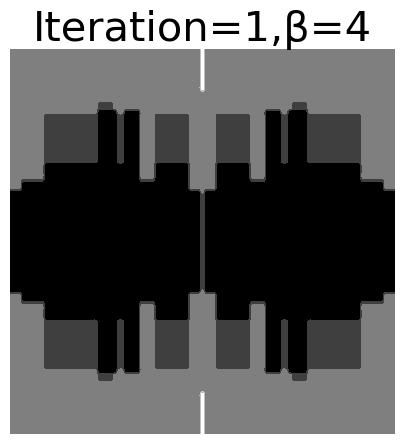

[0.5000977  0.50006811 0.50005605 ... 0.50005605 0.50006811 0.5000977 ]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


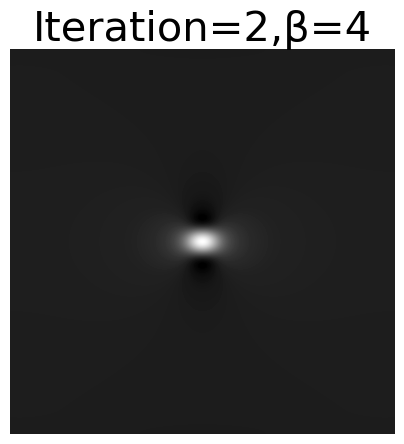

[0.50116819 0.5008153  0.50067134 ... 0.50067134 0.5008153  0.50116819]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


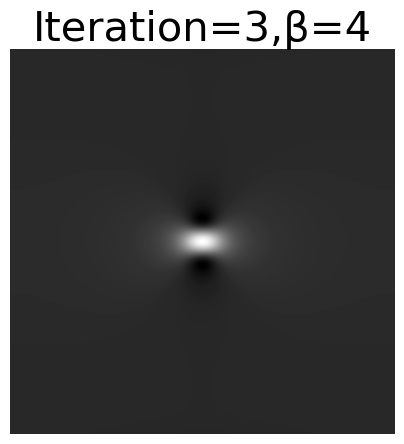

[0.53010839 0.52158935 0.51799572 ... 0.51799572 0.52158935 0.53010839]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


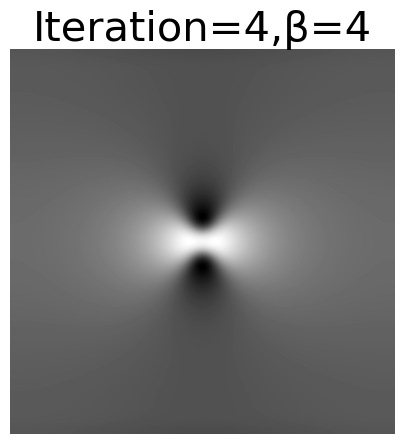

[1. 1. 1. ... 1. 1. 1.]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


/home/ming/anaconda3/envs/mp/lib/python3.8/site-packages/meep/geom.py:588: UserWarning: The weights parameter of MaterialGrid must be in the range [0,1].
  warnings.warn(


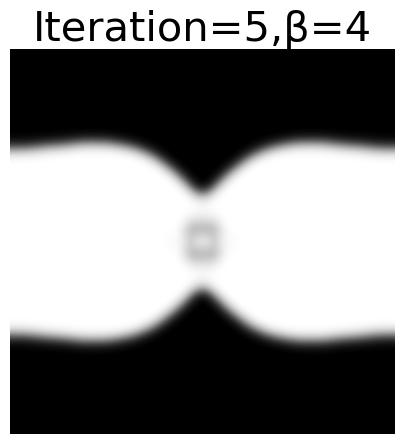

[0.97816126 0.93328344 0.9116444  ... 0.9116444  0.93328344 0.97816126]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


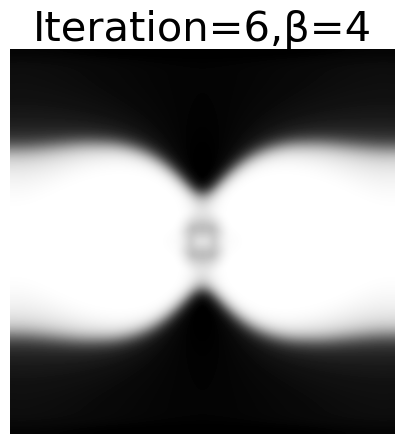

[0.70809327 0.66538903 0.64706258 ... 0.64706258 0.66538903 0.70809327]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


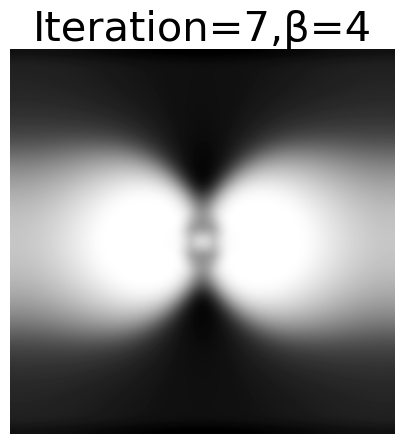

[0.55904183 0.54274249 0.53619944 ... 0.53619944 0.54274249 0.55904183]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


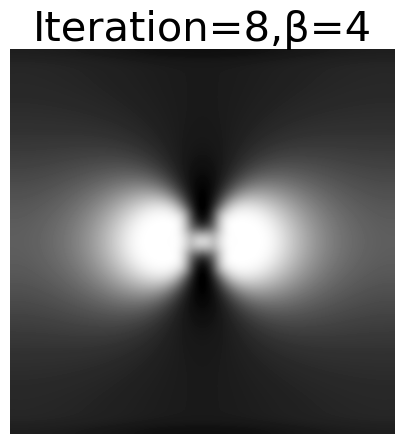

[0.53322198 0.52382076 0.51990163 ... 0.51990163 0.52382076 0.53322198]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


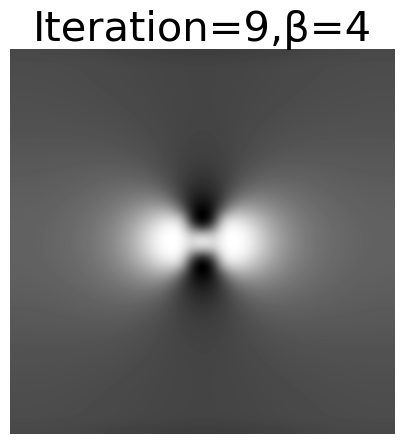

[0.53055372 0.52190783 0.51826753 ... 0.51826753 0.52190783 0.53055372]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


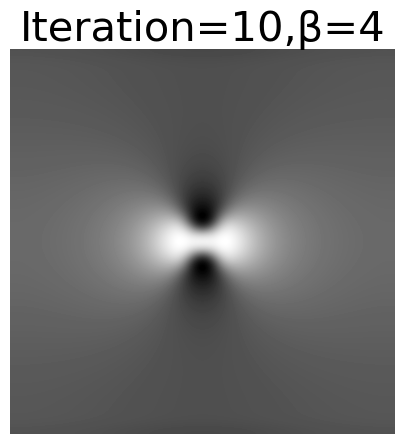

[0.53020268 0.52165676 0.51805325 ... 0.51805325 0.52165676 0.53020268]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


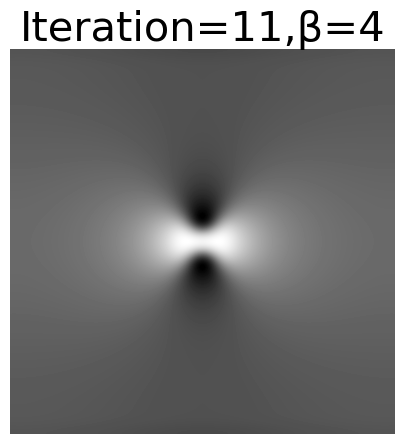

[0.53013415 0.52160776 0.51801144 ... 0.51801144 0.52160776 0.53013415]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


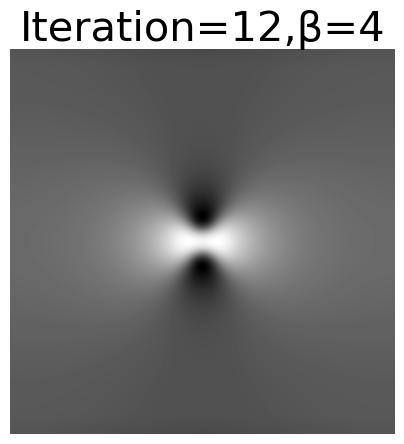

[0.53015077 0.52161964 0.51802155 ... 0.51802155 0.52161964 0.53015077]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


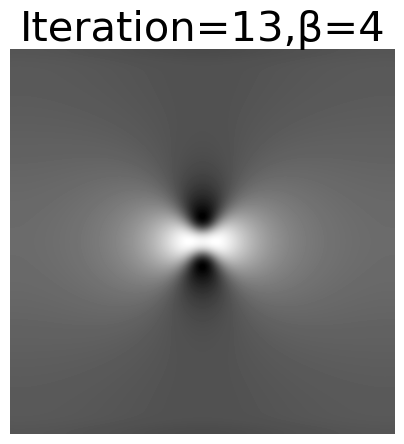

[0.53013925 0.5216114  0.51801454 ... 0.51801454 0.5216114  0.53013925]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


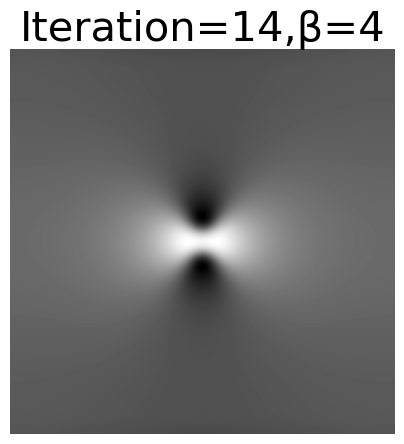

[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


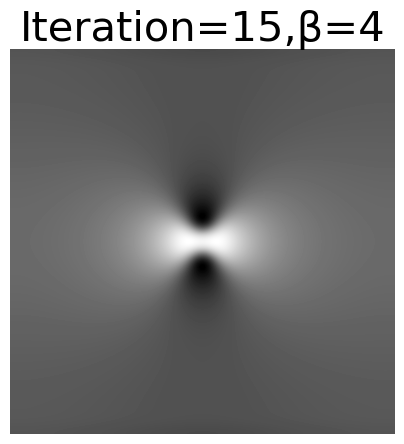

[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


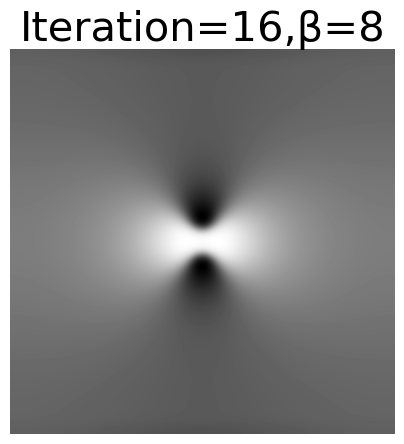

[0.53608137 0.52597061 0.52182676 ... 0.52182676 0.52597061 0.53608137]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


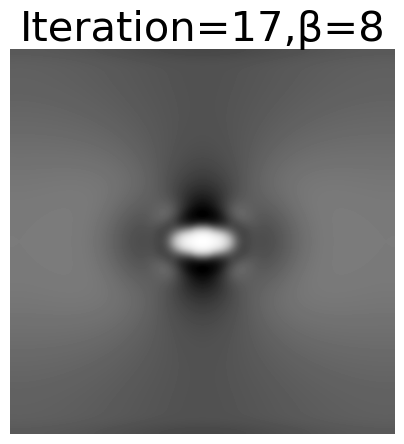

[0.53076693 0.52206929 0.51841423 ... 0.51841423 0.52206929 0.53076693]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


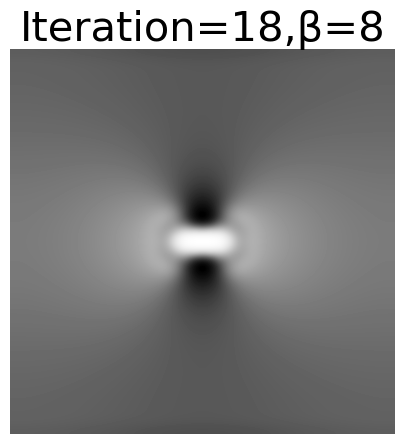

[0.53027397 0.52170967 0.51810033 ... 0.51810033 0.52170967 0.53027397]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


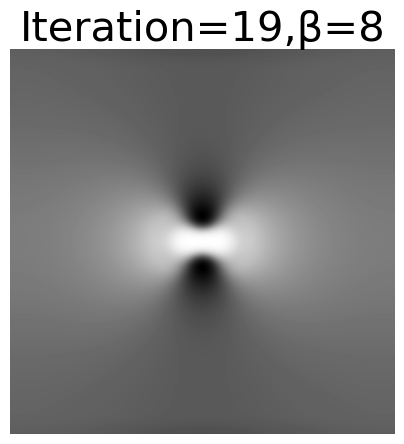

[0.53017923 0.5216406  0.51804006 ... 0.51804006 0.5216406  0.53017923]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


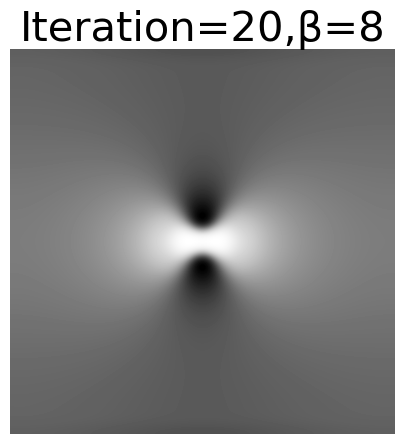

[0.53015242 0.52162105 0.51802301 ... 0.51802301 0.52162105 0.53015242]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


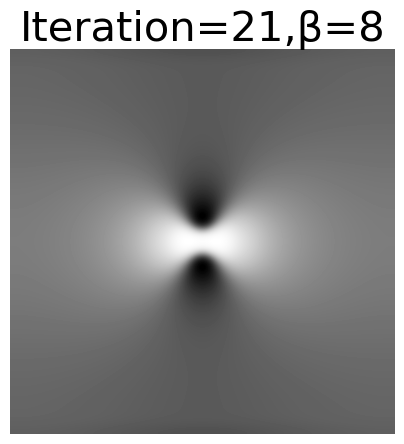

[0.53014249 0.52161381 0.51801668 ... 0.51801668 0.52161381 0.53014249]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


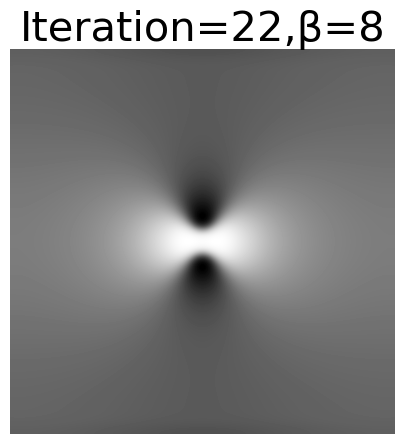

[0.53013881 0.52161113 0.51801435 ... 0.51801435 0.52161113 0.53013881]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


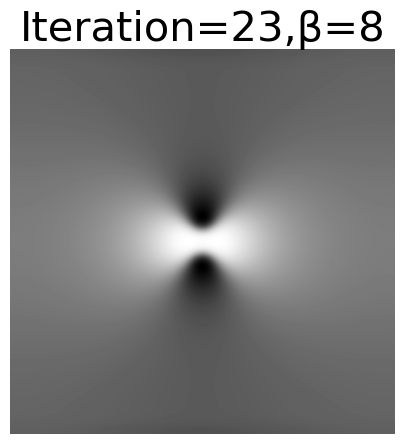

[0.53013728 0.52161002 0.51801338 ... 0.51801338 0.52161002 0.53013728]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


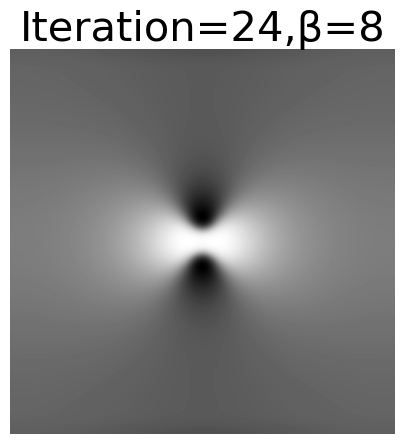

[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


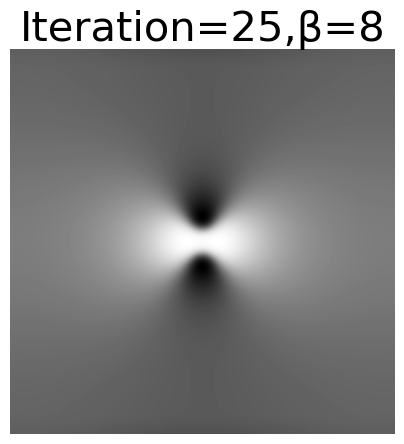

[0.53013691 0.52160974 0.51801314 ... 0.51801314 0.52160974 0.53013691]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


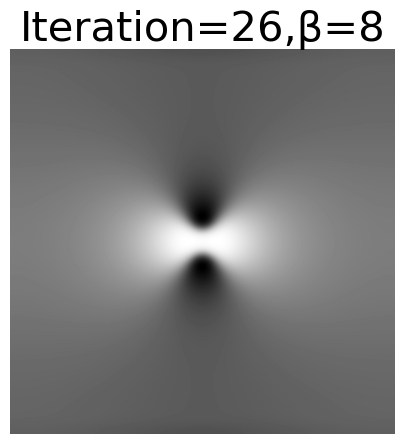

[0.53013679 0.52160966 0.51801306 ... 0.51801306 0.52160966 0.53013679]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


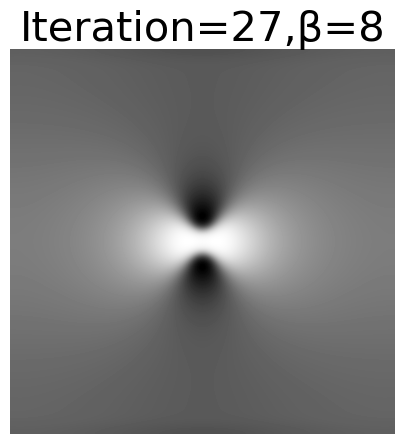

[0.53013673 0.52160962 0.51801303 ... 0.51801303 0.52160962 0.53013673]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


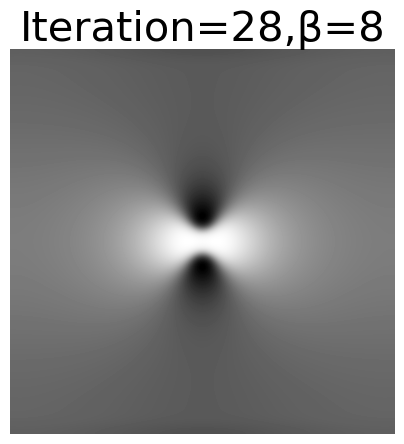

[0.53013671 0.5216096  0.51801301 ... 0.51801301 0.5216096  0.53013671]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


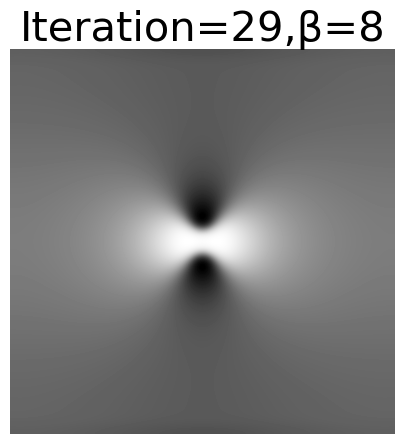

[0.5301367  0.52160959 0.518013   ... 0.518013   0.52160959 0.5301367 ]
2
0.5
8
[0.5301362  0.52160923 0.51801269 ... 0.51801269 0.52160923 0.5301362 ]


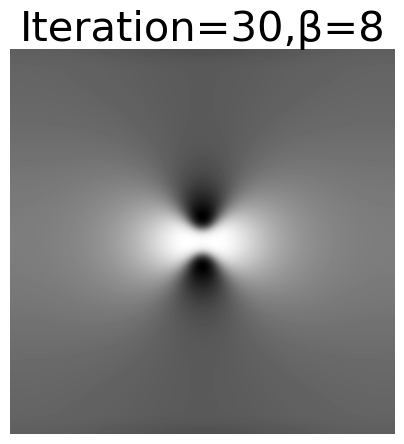

[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


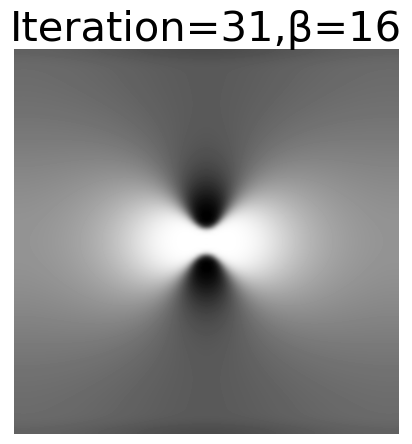

[0.5381051  0.52775899 0.52374713 ... 0.52374713 0.52775899 0.5381051 ]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


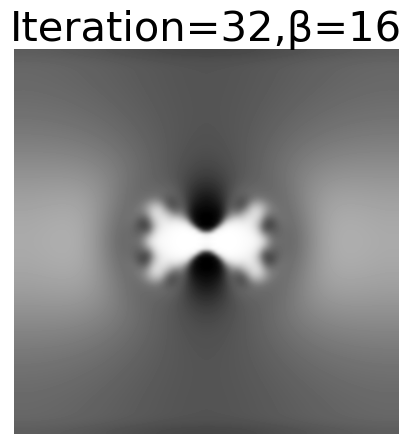

[0.54312442 0.53169753 0.5275026  ... 0.5275026  0.53169753 0.54312442]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


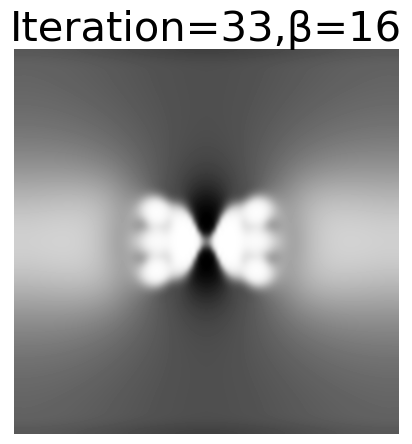

[0.53877177 0.52828014 0.52424373 ... 0.52424373 0.52828014 0.53877177]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


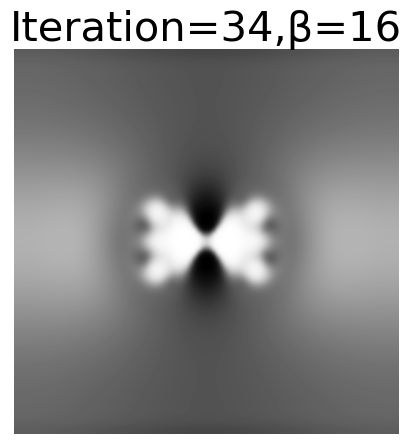

[0.53827014 0.52788795 0.52387001 ... 0.52387001 0.52788795 0.53827014]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


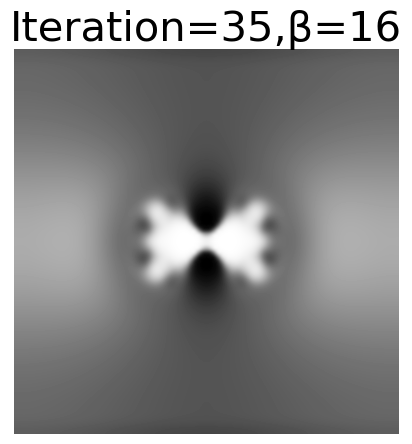

[0.53815907 0.52780116 0.5237873  ... 0.5237873  0.52780116 0.53815907]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


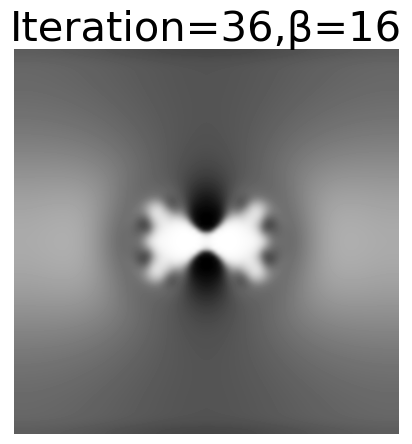

[0.53812236 0.52777248 0.52375998 ... 0.52375998 0.52777248 0.53812236]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


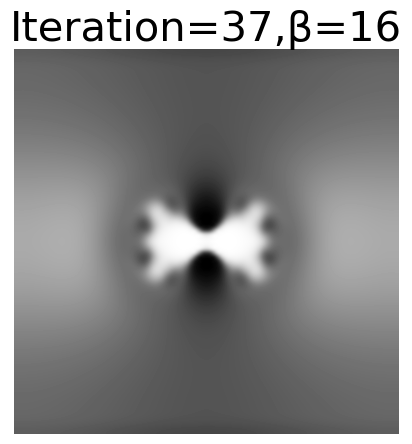

[0.53811167 0.52776413 0.52375202 ... 0.52375202 0.52776413 0.53811167]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


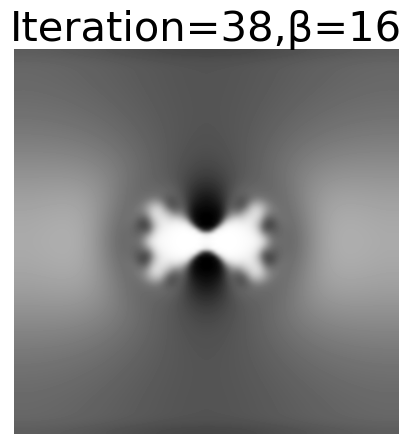

[0.53811523 0.5277669  0.52375466 ... 0.52375466 0.5277669  0.53811523]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


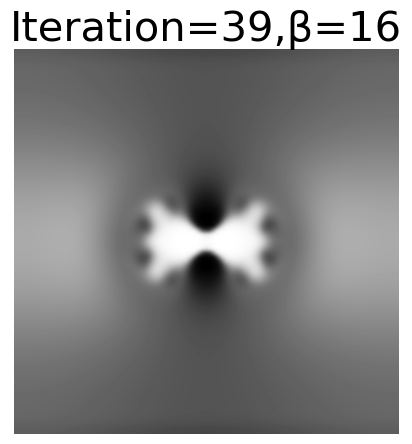

[0.53811303 0.52776519 0.52375302 ... 0.52375302 0.52776519 0.53811303]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


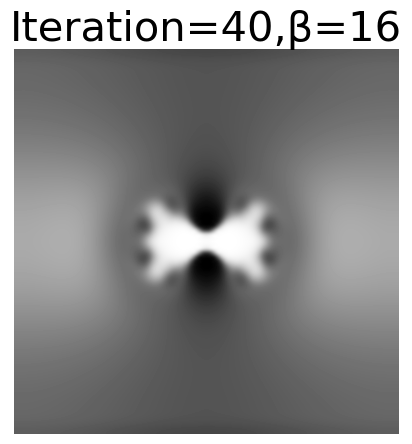

[0.53811364 0.52776566 0.52375348 ... 0.52375348 0.52776566 0.53811364]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


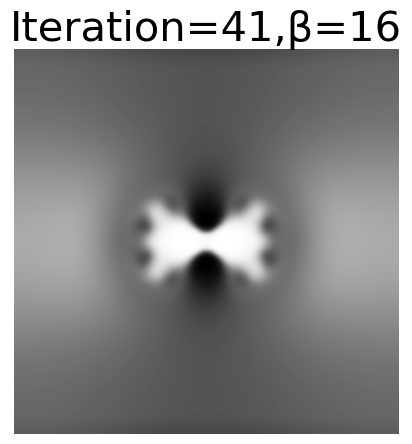

[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


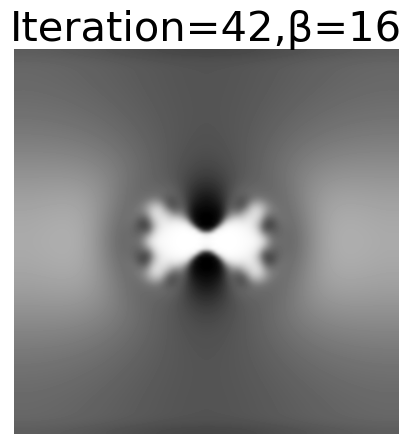

[0.53811344 0.5277655  0.52375333 ... 0.52375333 0.5277655  0.53811344]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


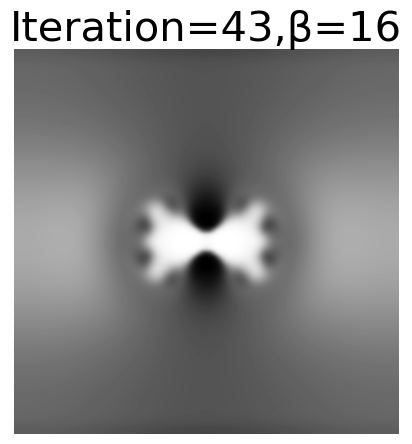

[0.53811336 0.52776544 0.52375327 ... 0.52375327 0.52776544 0.53811336]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


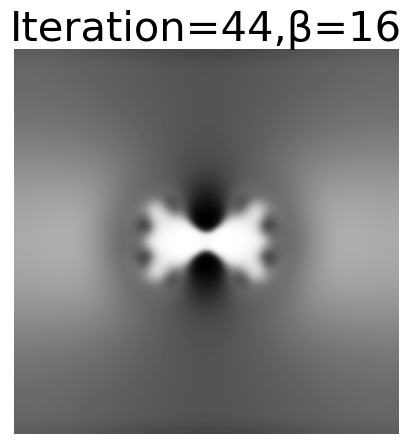

[0.53811332 0.52776542 0.52375324 ... 0.52375324 0.52776542 0.53811332]
2
0.5
16
[0.53013669 0.52160958 0.518013   ... 0.518013   0.52160958 0.53013669]


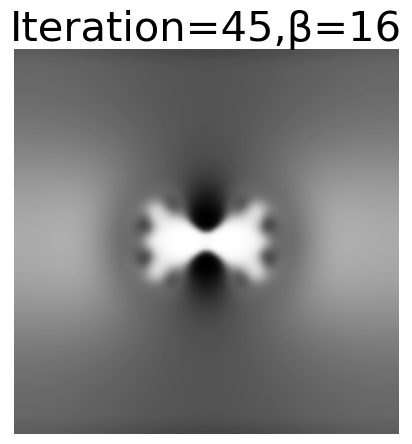

[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


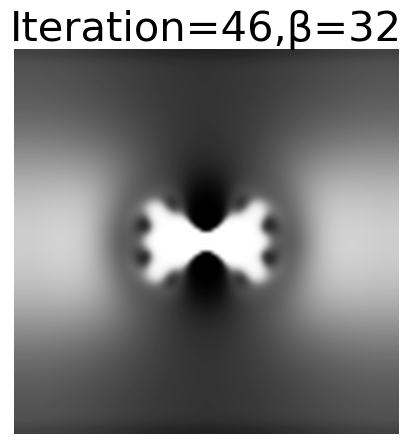

[0.5513409  0.53951256 0.53649265 ... 0.53649265 0.53951256 0.5513409 ]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


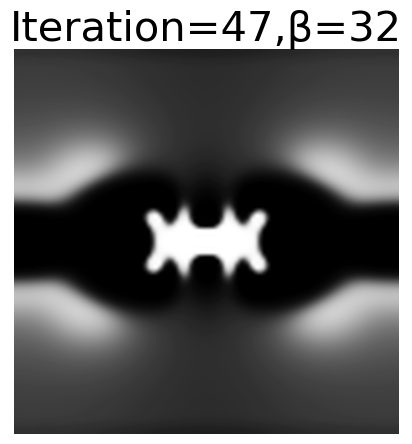

[0.53950119 0.52899129 0.5250875  ... 0.5250875  0.52899129 0.53950119]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


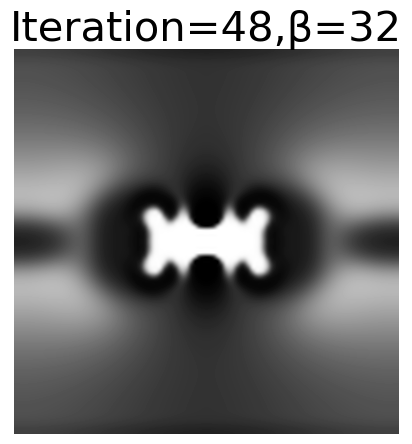

[0.53825364 0.52788928 0.52388812 ... 0.52388812 0.52788928 0.53825364]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


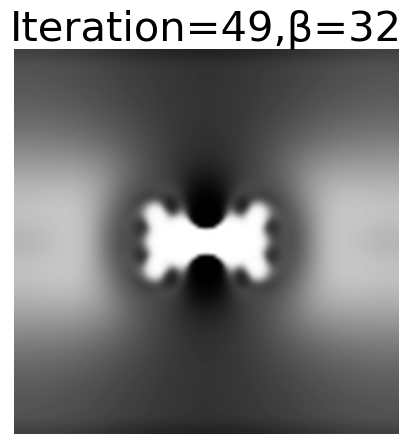

[0.53814319 0.52779178 0.52378195 ... 0.52378195 0.52779178 0.53814319]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


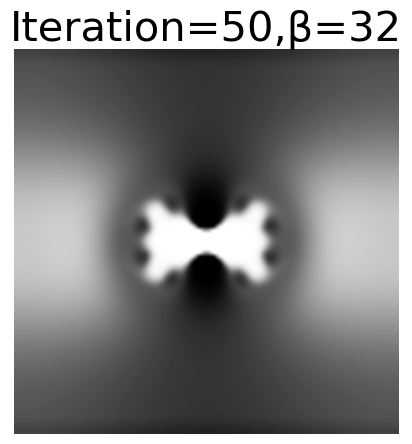

[0.53812222 0.52777328 0.5237618  ... 0.5237618  0.52777328 0.53812222]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


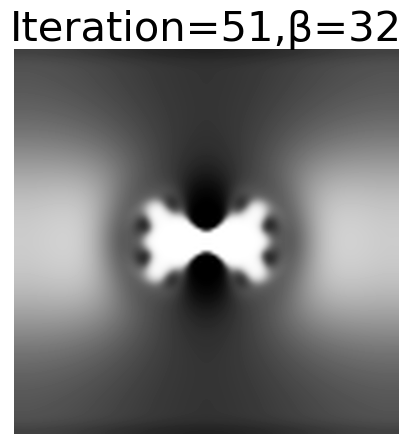

[0.53811645 0.52776818 0.52375626 ... 0.52375626 0.52776818 0.53811645]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


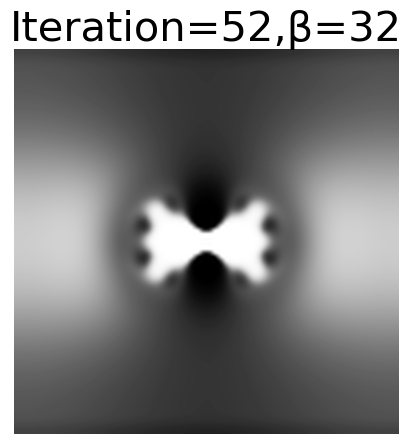

[0.53811445 0.52776641 0.52375433 ... 0.52375433 0.52776641 0.53811445]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


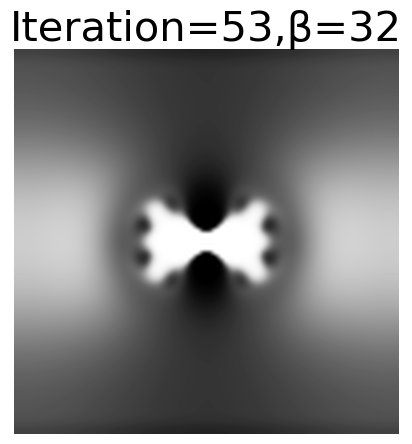

[0.53811587 0.52776767 0.5237557  ... 0.5237557  0.52776767 0.53811587]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


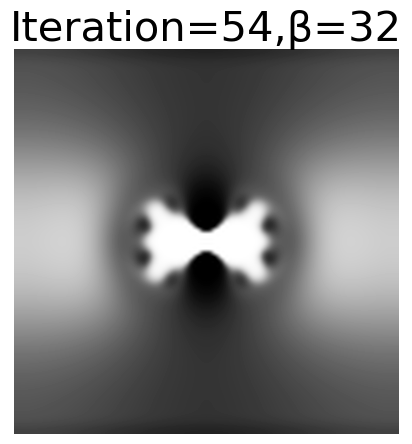

[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


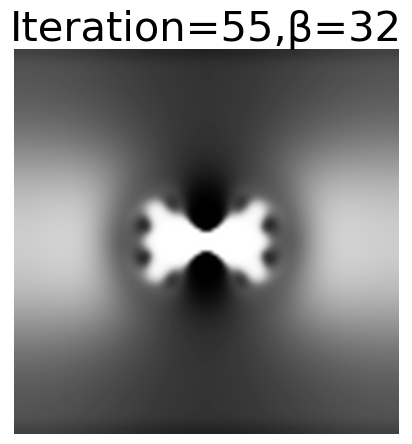

[0.53812293 0.5277739  0.52376249 ... 0.52376249 0.5277739  0.53812293]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


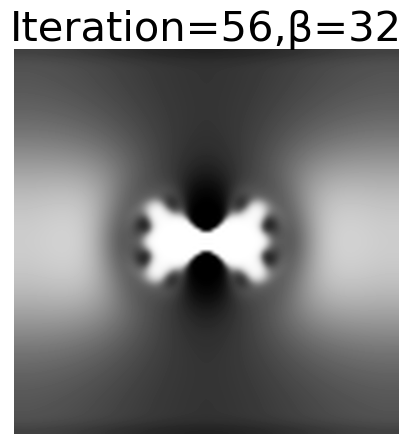

[0.53811899 0.52777042 0.5237587  ... 0.5237587  0.52777042 0.53811899]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


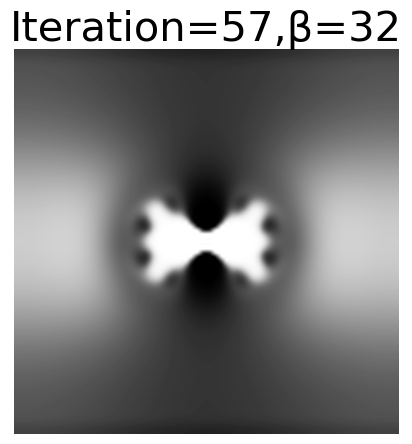

[0.5381169  0.52776858 0.52375669 ... 0.52375669 0.52776858 0.5381169 ]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


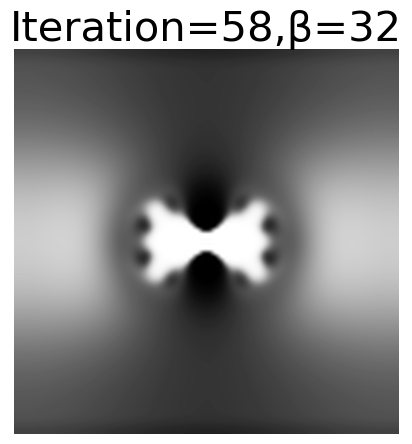

[0.53811657 0.52776829 0.52375637 ... 0.52375637 0.52776829 0.53811657]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


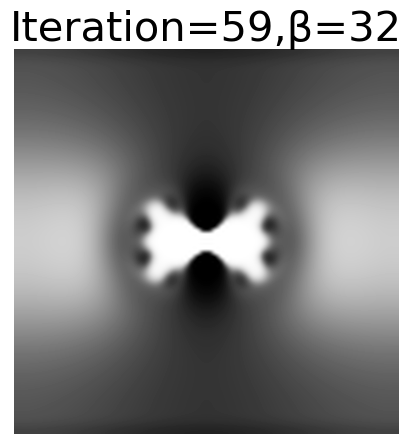

[0.53811652 0.52776824 0.52375632 ... 0.52375632 0.52776824 0.53811652]
2
0.5
32
[0.5381133  0.5277654  0.52375323 ... 0.52375323 0.5277654  0.5381133 ]


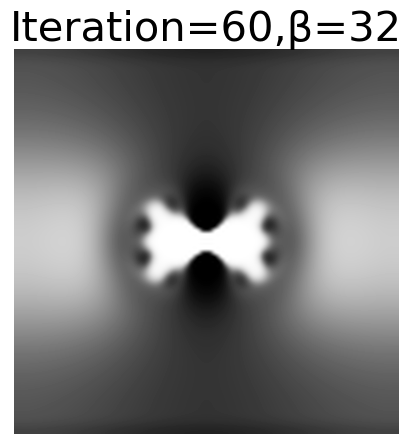

[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


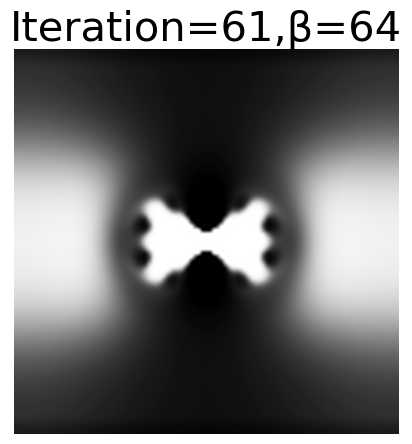

[0.5395284  0.52940881 0.52603937 ... 0.52603937 0.52940881 0.5395284 ]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


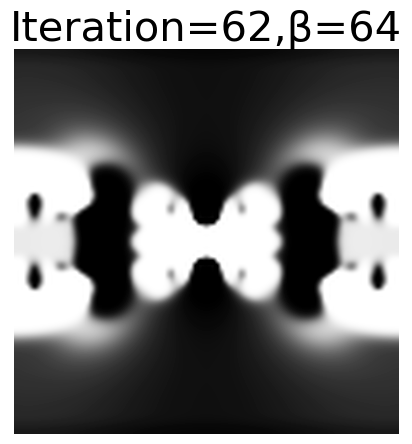

[0.53825842 0.52793326 0.52398651 ... 0.52398651 0.52793326 0.53825842]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


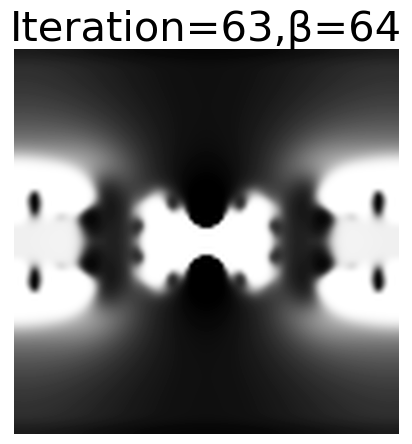

[0.53813281 0.5277872  0.52378277 ... 0.52378277 0.5277872  0.53813281]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


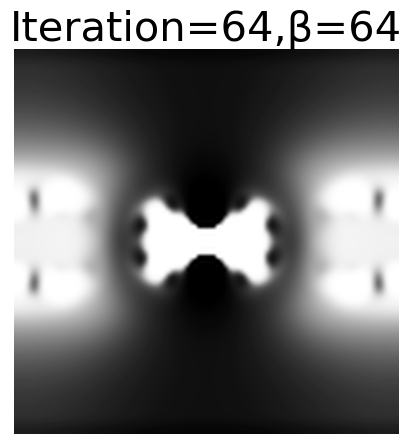

[0.53813771 0.52779289 0.52379072 ... 0.52379072 0.52779289 0.53813771]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


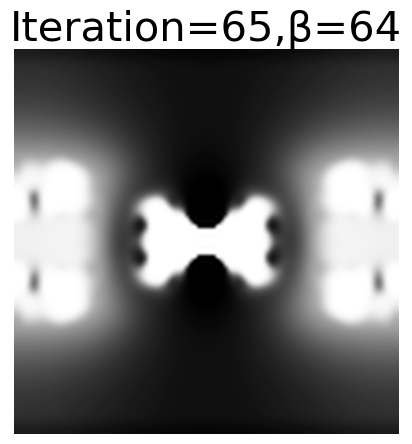

[0.53813446 0.52778911 0.52378544 ... 0.52378544 0.52778911 0.53813446]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


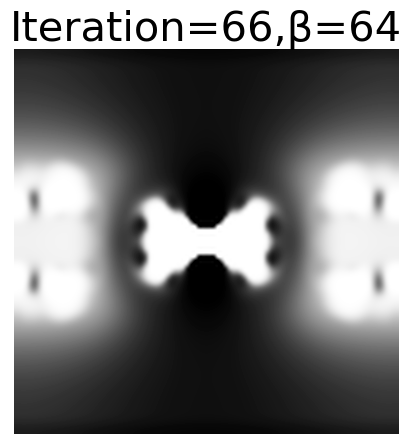

[0.53813513 0.52778988 0.52378651 ... 0.52378651 0.52778988 0.53813513]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


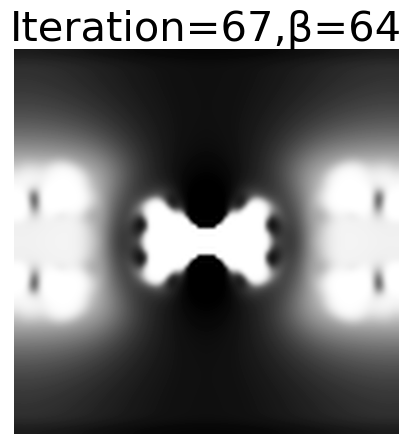

[0.53813547 0.52779028 0.52378707 ... 0.52378707 0.52779028 0.53813547]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


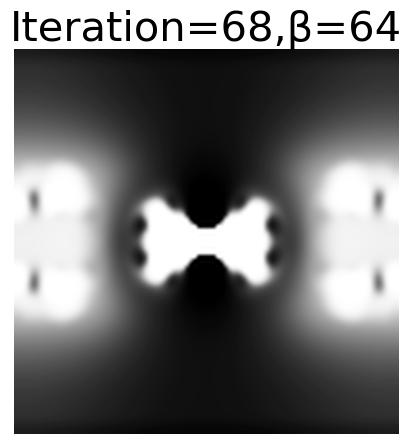

[0.53813565 0.52779049 0.52378735 ... 0.52378735 0.52779049 0.53813565]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


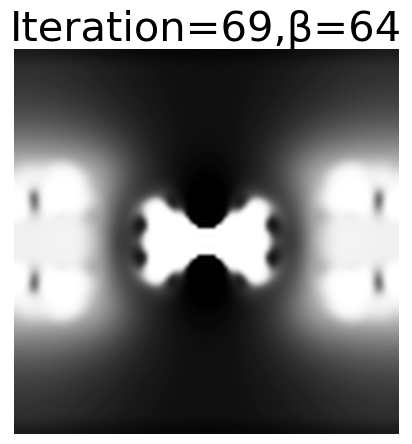

[0.53813572 0.52779057 0.52378747 ... 0.52378747 0.52779057 0.53813572]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


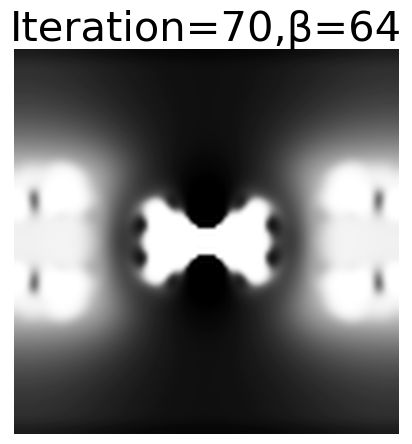

[0.53813576 0.52779061 0.52378753 ... 0.52378753 0.52779061 0.53813576]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


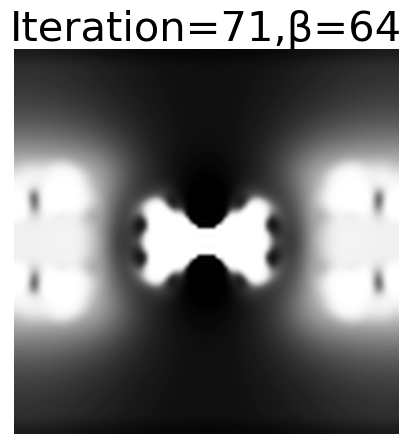

[0.53813578 0.52779064 0.52378756 ... 0.52378756 0.52779064 0.53813578]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


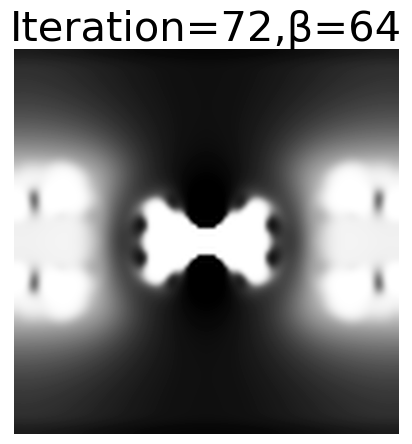

[0.53813579 0.52779065 0.52378758 ... 0.52378758 0.52779065 0.53813579]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


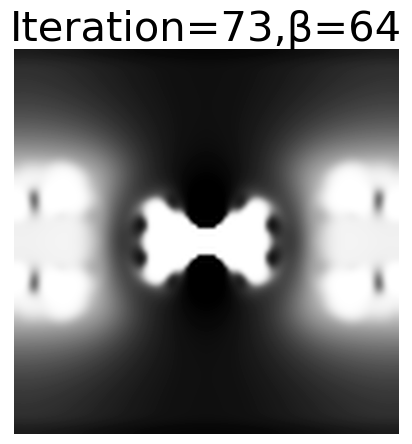

[0.53813579 0.52779066 0.52378759 ... 0.52378759 0.52779066 0.53813579]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


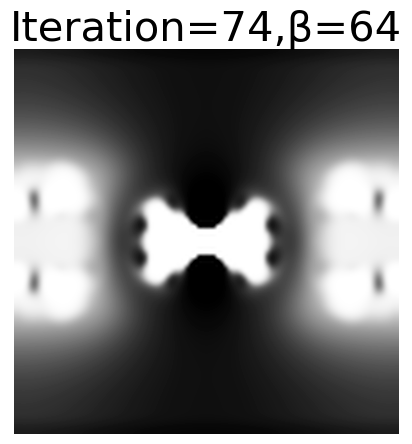

[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]
2
0.5
64
[0.53811651 0.52776823 0.52375631 ... 0.52375631 0.52776823 0.53811651]


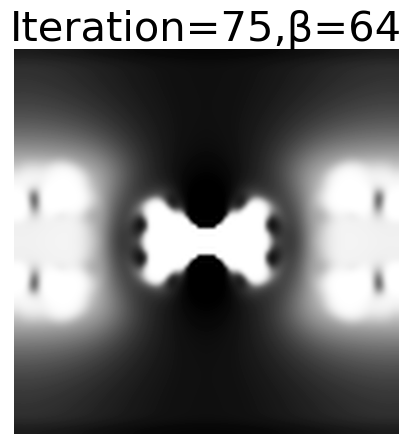

[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


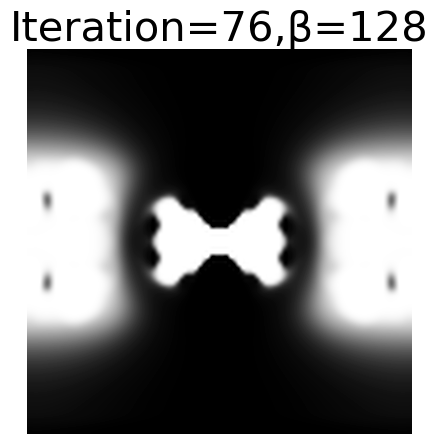

[0.53817714 0.52787847 0.52396492 ... 0.52396492 0.52787847 0.53817714]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


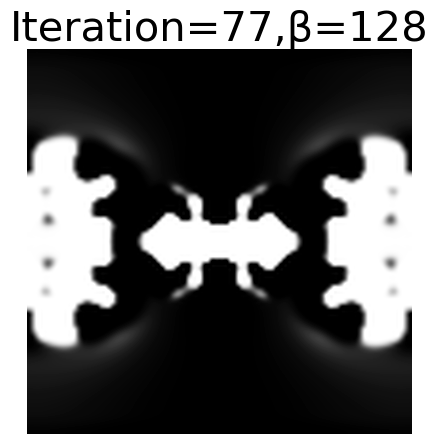

[0.53813993 0.52779945 0.52380534 ... 0.52380534 0.52779945 0.53813993]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


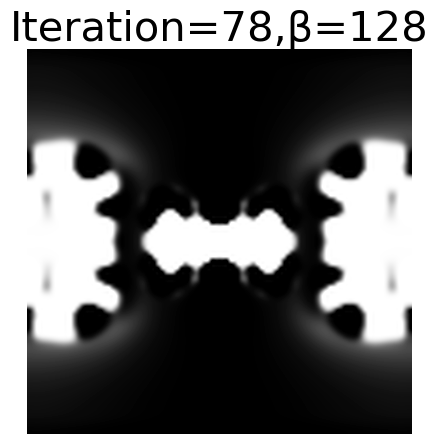

[0.53813624 0.52779161 0.5237895  ... 0.5237895  0.52779161 0.53813624]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


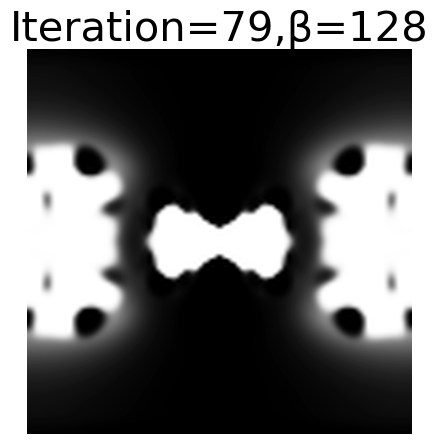

[0.53813589 0.52779087 0.52378801 ... 0.52378801 0.52779087 0.53813589]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


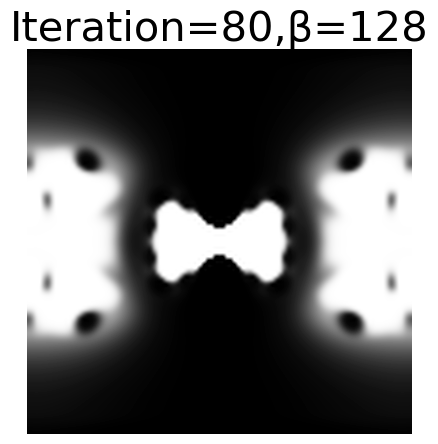

[0.5381359  0.52779088 0.52378803 ... 0.52378803 0.52779088 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


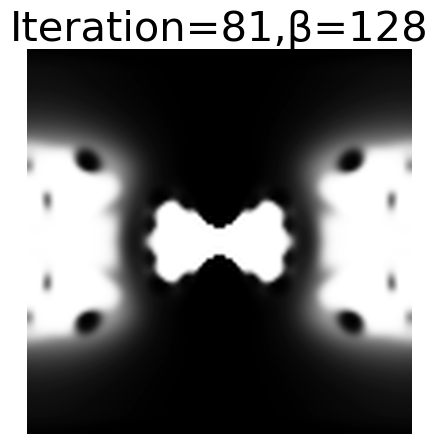

[0.53813591 0.5277909  0.52378808 ... 0.52378808 0.5277909  0.53813591]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


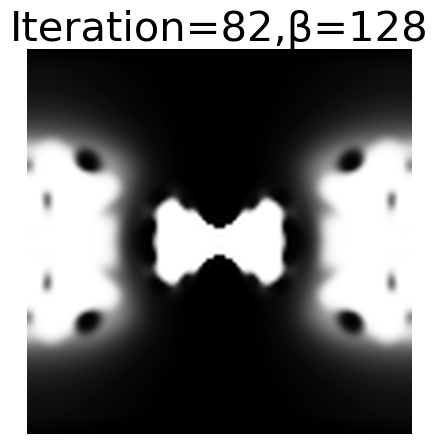

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


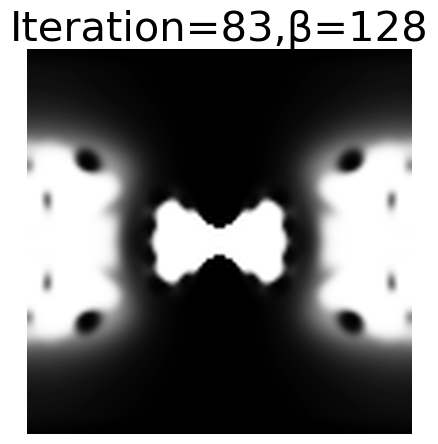

[0.53813591 0.52779089 0.52378806 ... 0.52378806 0.52779089 0.53813591]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


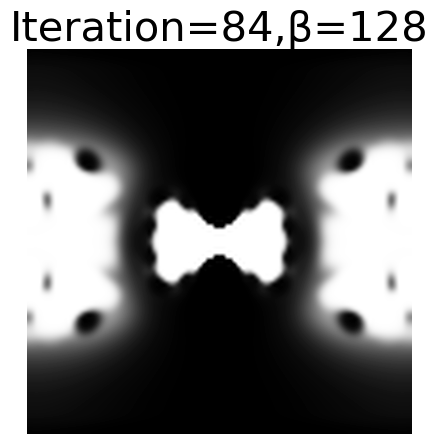

[0.5381359  0.52779089 0.52378805 ... 0.52378805 0.52779089 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


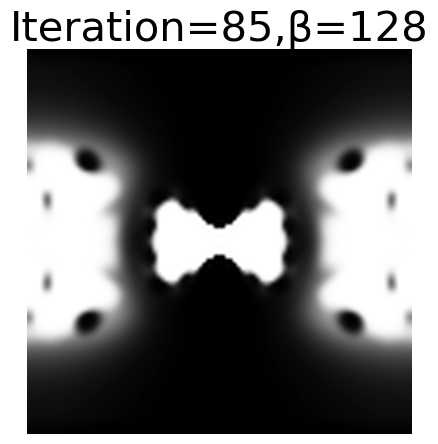

[0.5381359  0.52779089 0.52378805 ... 0.52378805 0.52779089 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


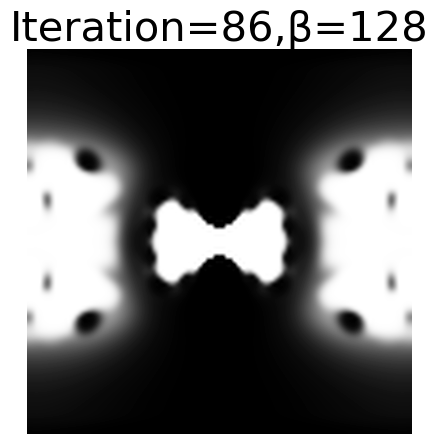

[0.5381359  0.52779089 0.52378805 ... 0.52378805 0.52779089 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


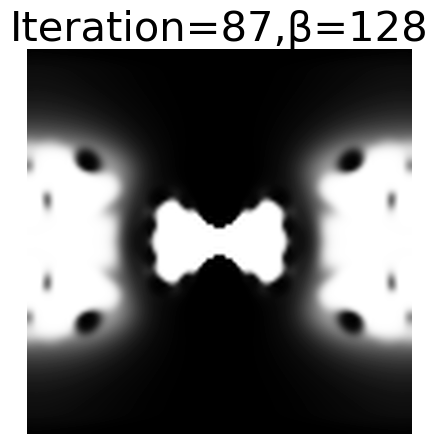

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


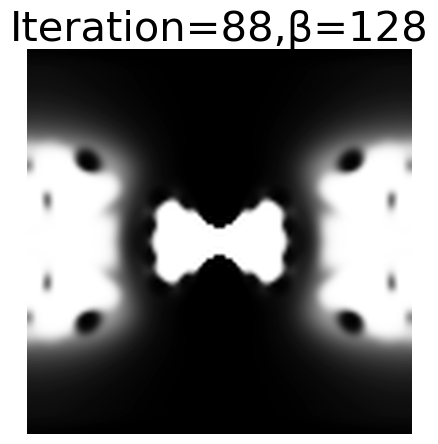

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


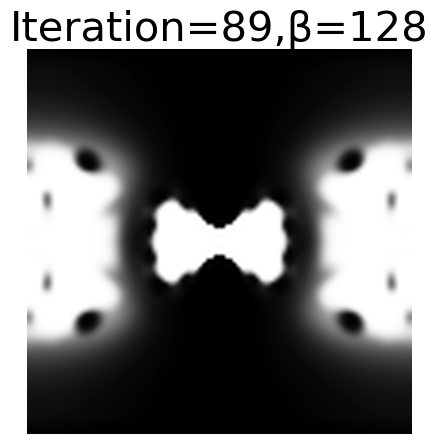

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
128
[0.5381358  0.52779066 0.5237876  ... 0.5237876  0.52779066 0.5381358 ]


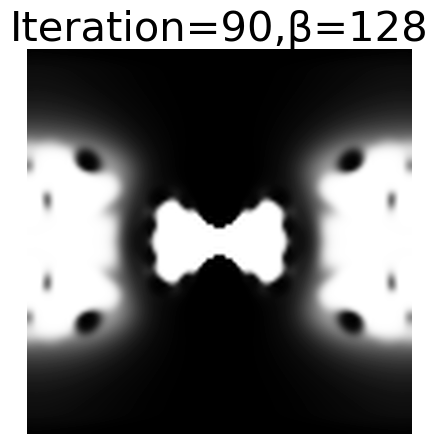

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


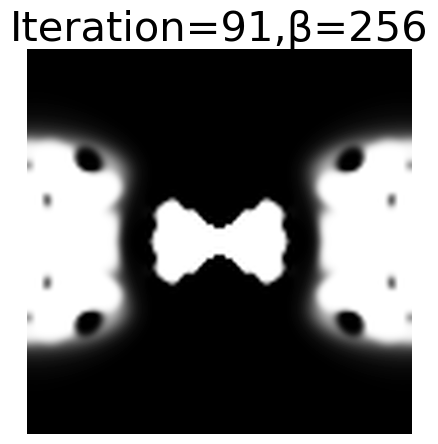

[0.53813591 0.52779091 0.52378814 ... 0.52378814 0.52779091 0.53813591]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


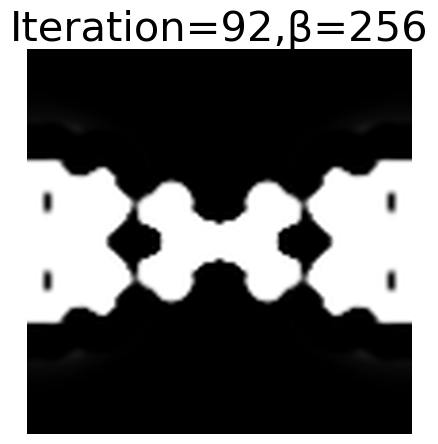

[0.5381359  0.52779089 0.52378806 ... 0.52378806 0.52779089 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


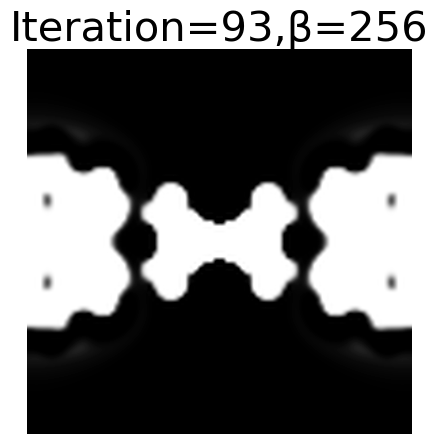

[0.5381359  0.52779089 0.52378805 ... 0.52378805 0.52779089 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


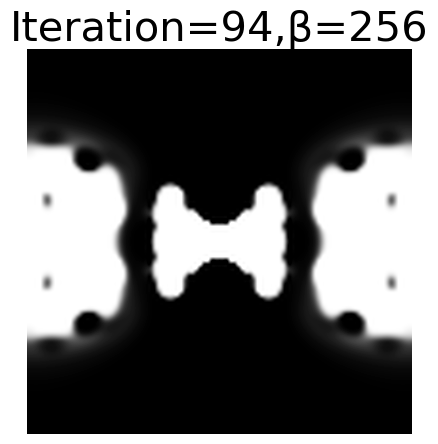

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


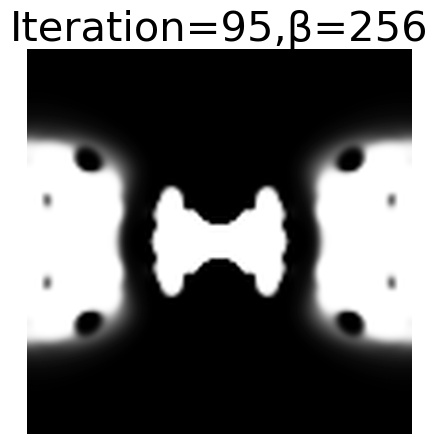

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


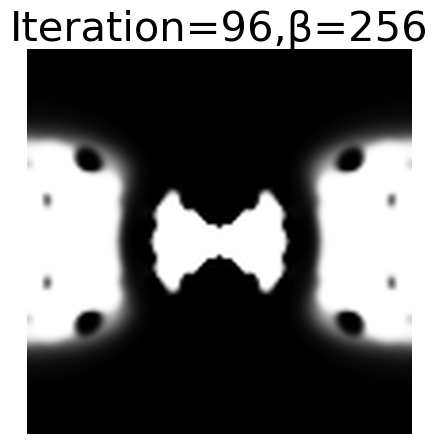

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


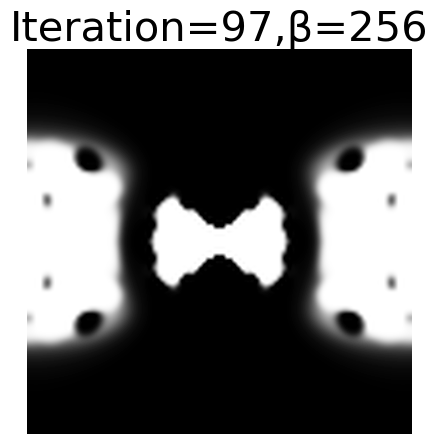

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


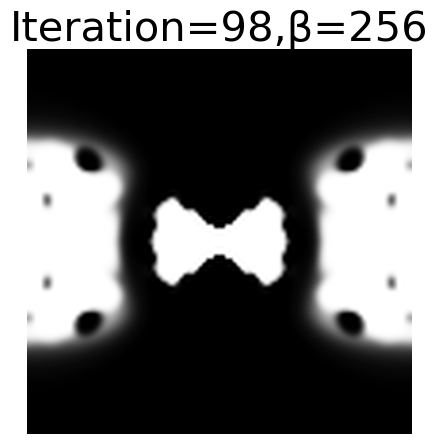

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


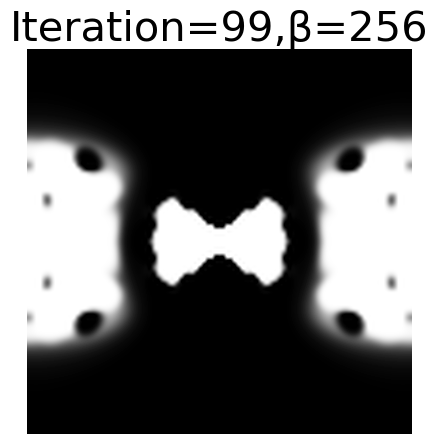

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


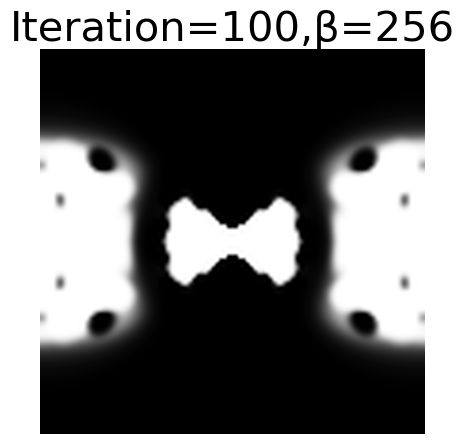

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


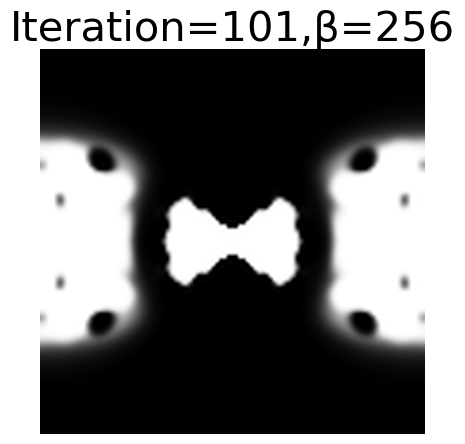

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


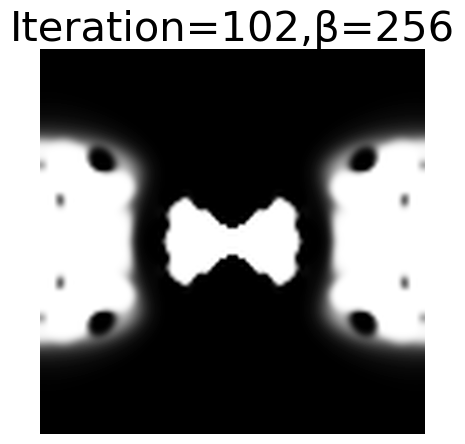

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


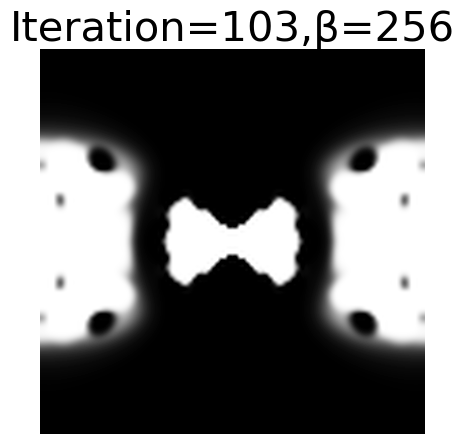

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


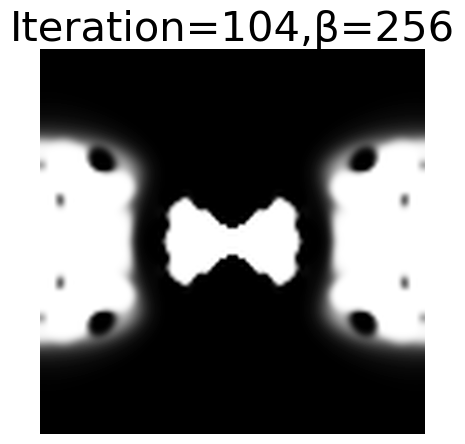

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
256
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


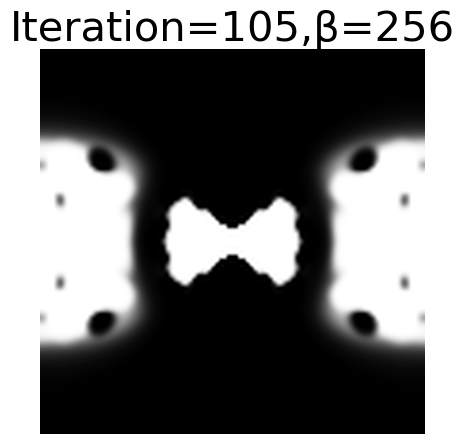

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


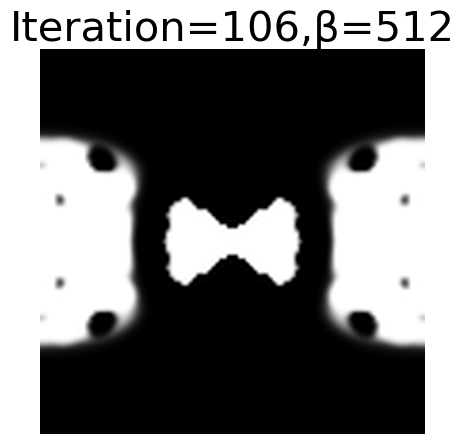

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


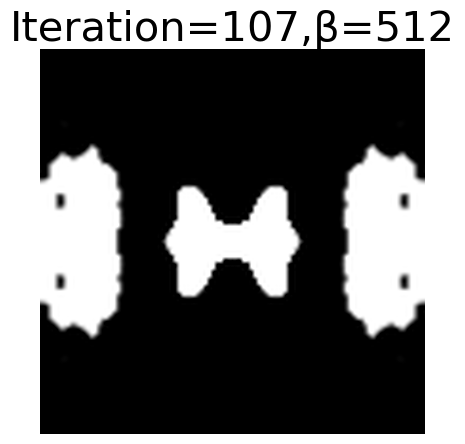

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


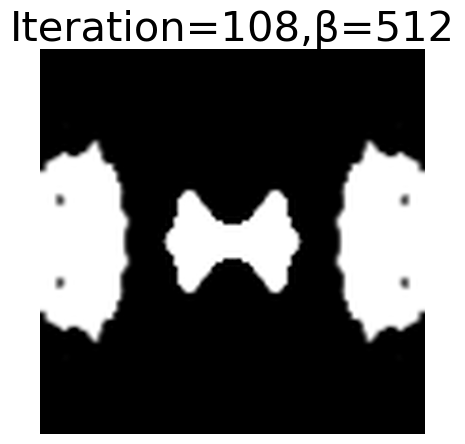

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


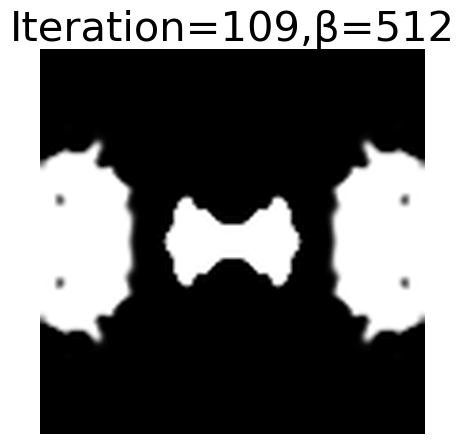

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


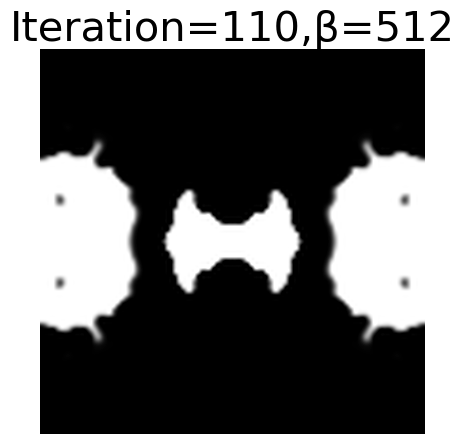

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


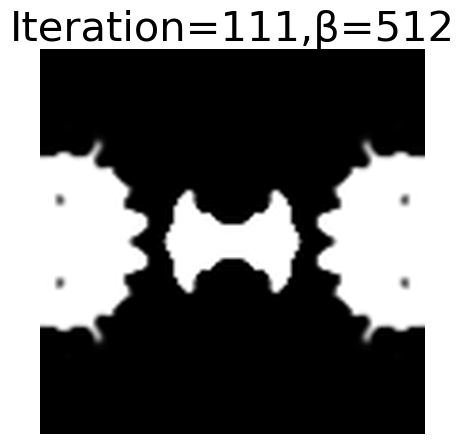

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


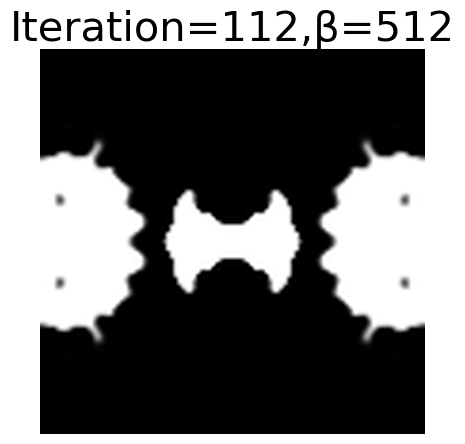

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


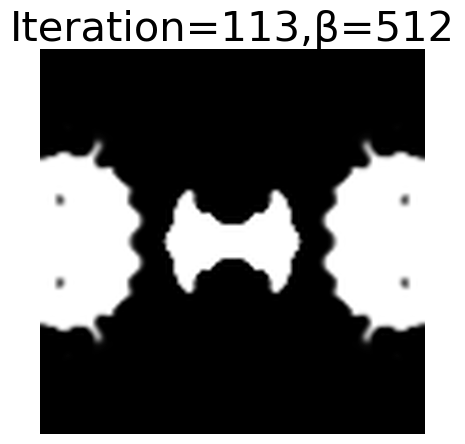

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


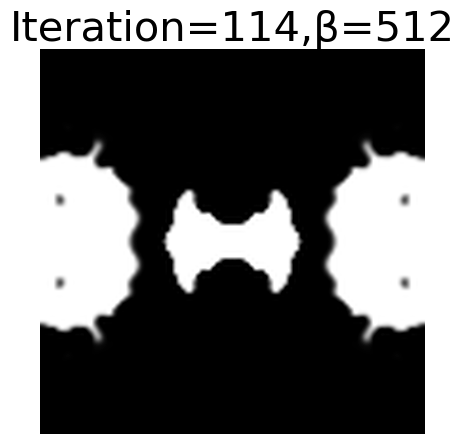

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


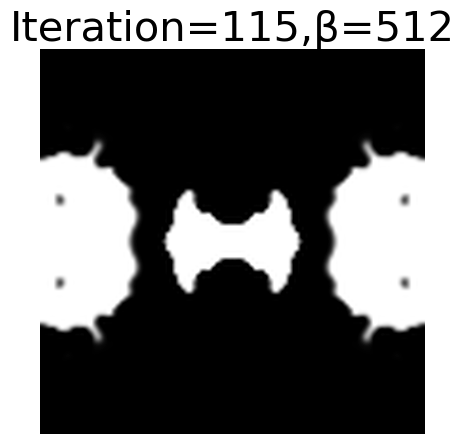

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


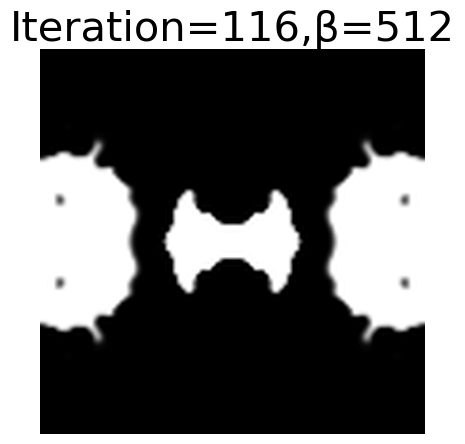

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


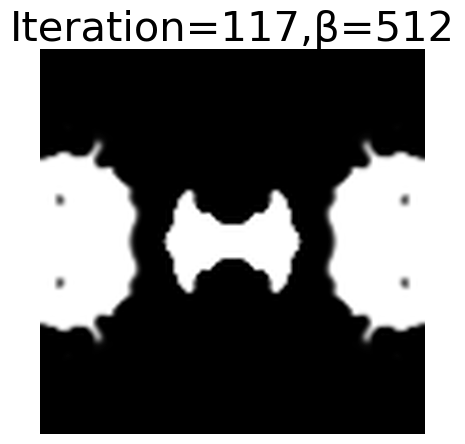

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


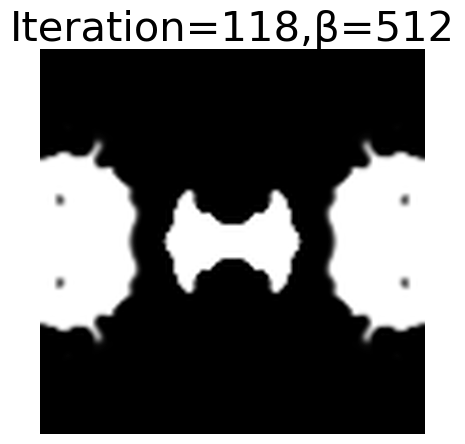

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


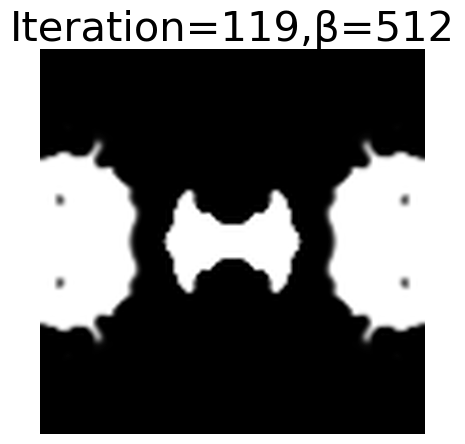

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
512
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


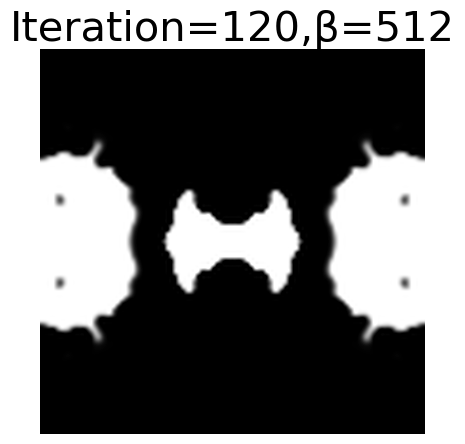

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


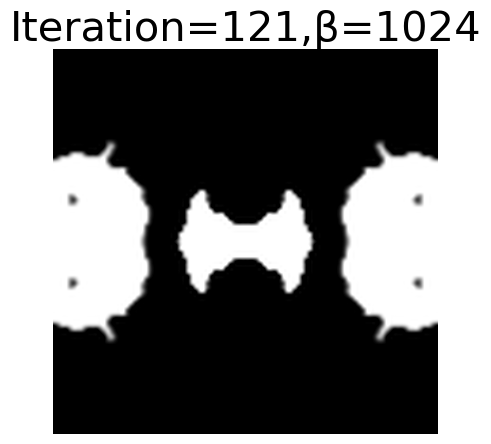

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


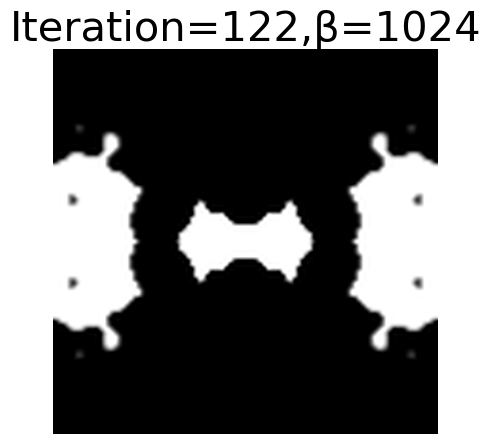

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


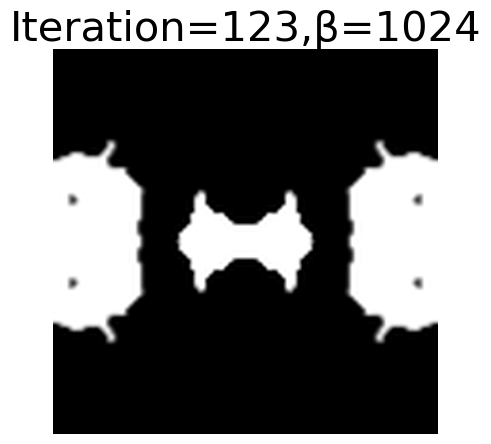

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


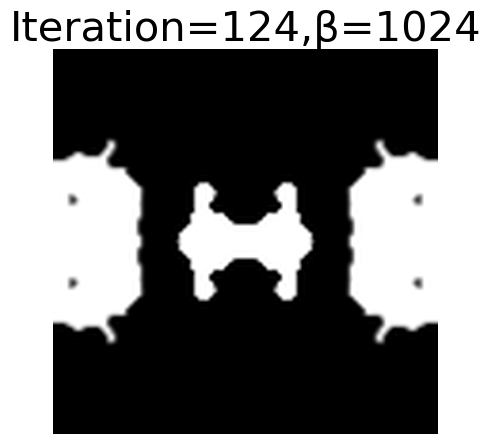

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


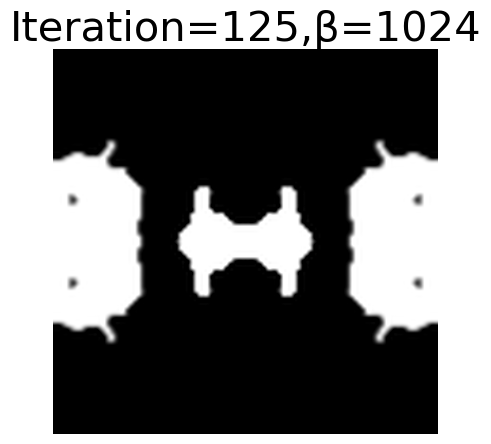

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


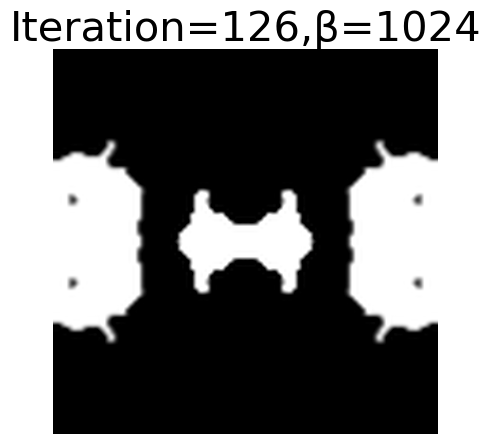

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


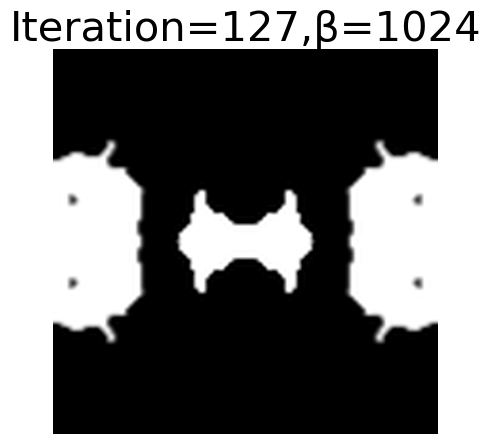

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


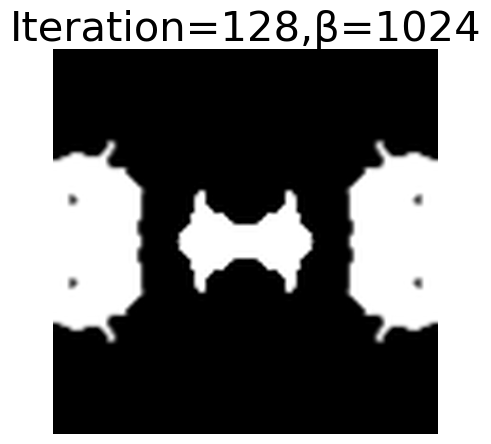

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


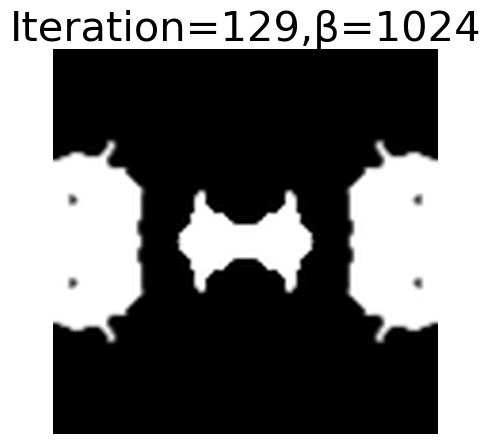

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


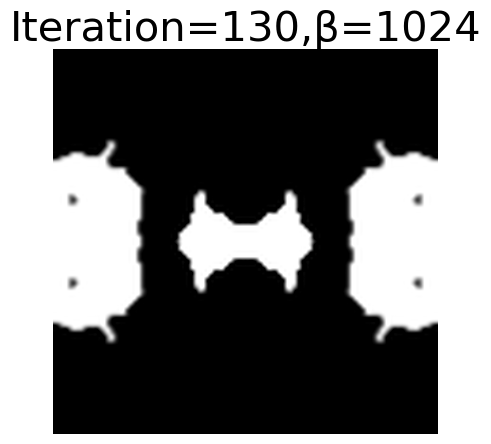

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


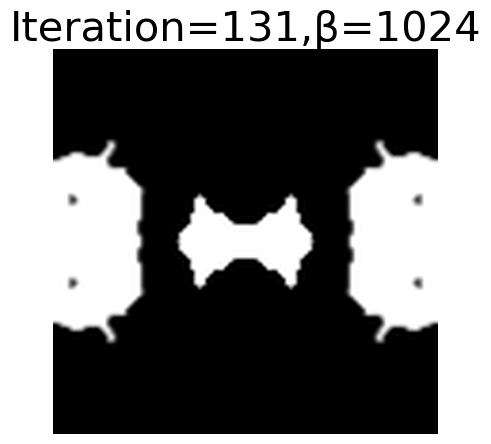

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


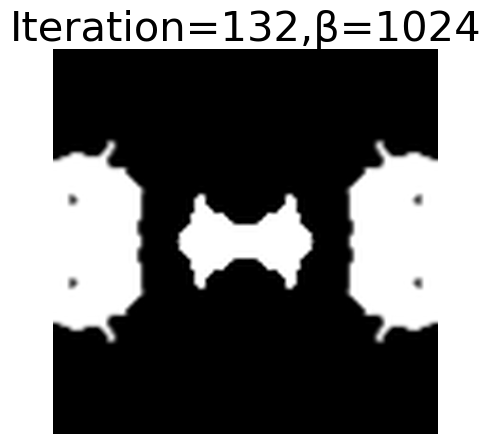

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


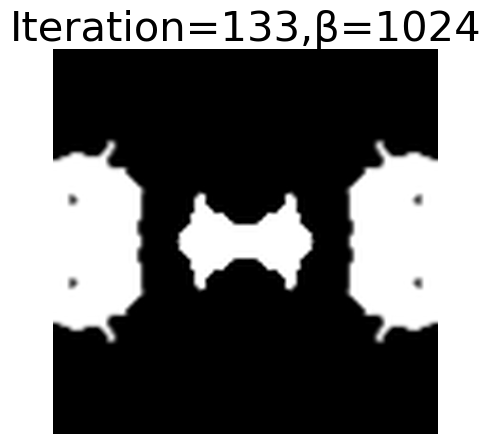

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


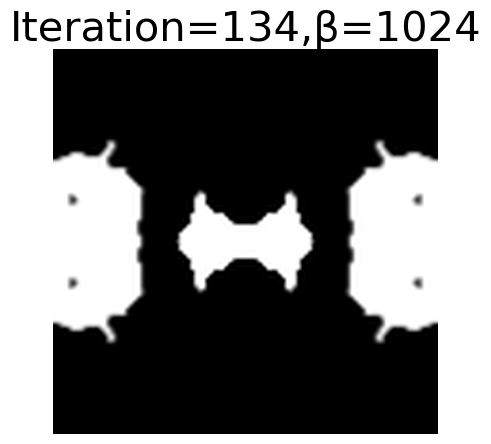

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
1024
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


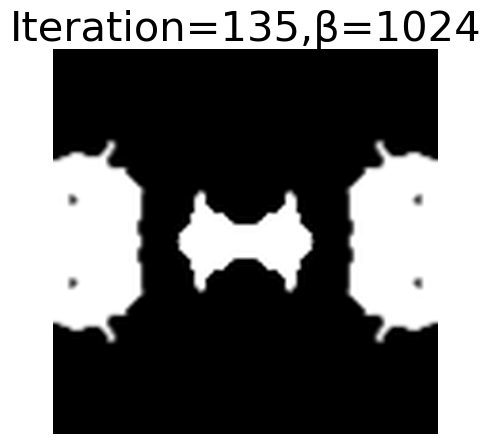

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


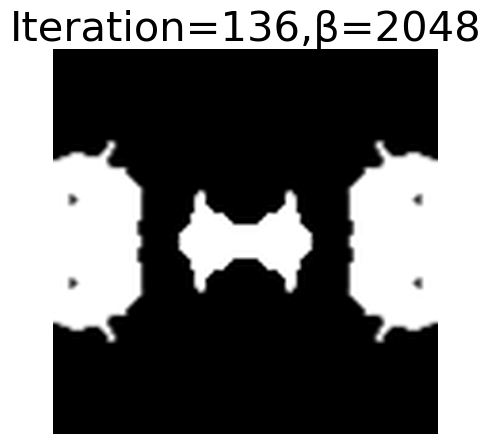

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


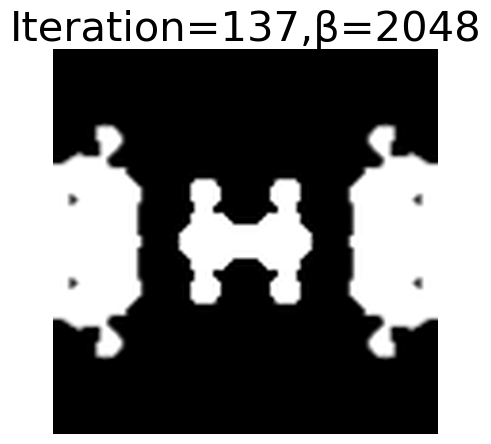

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


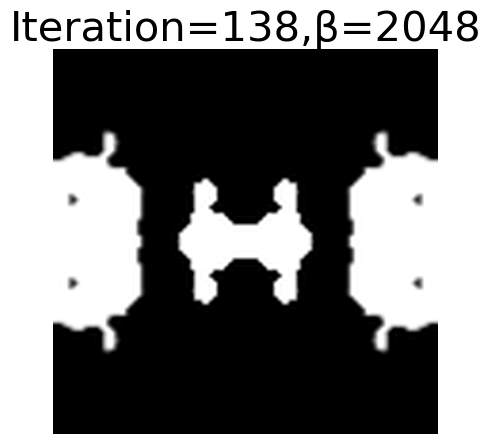

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


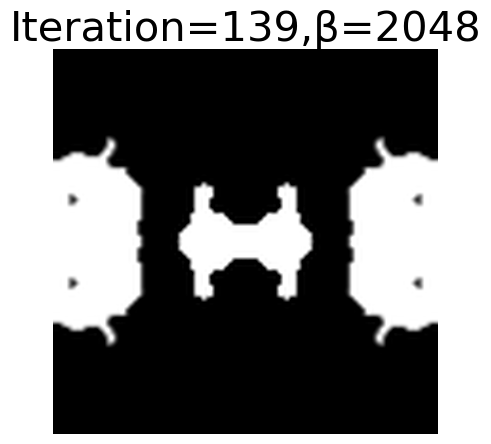

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


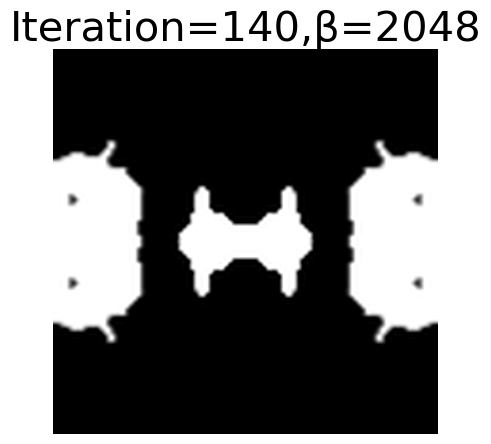

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


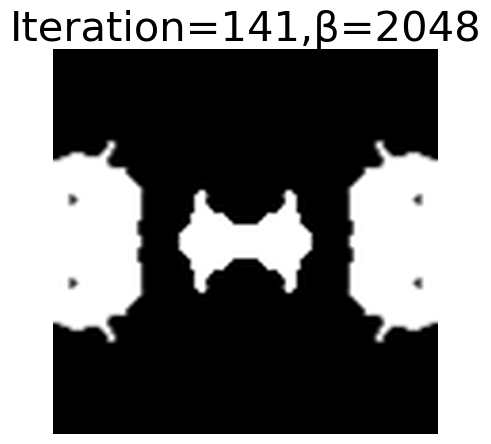

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


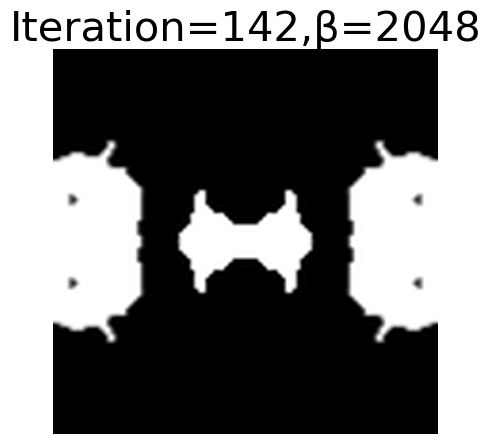

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


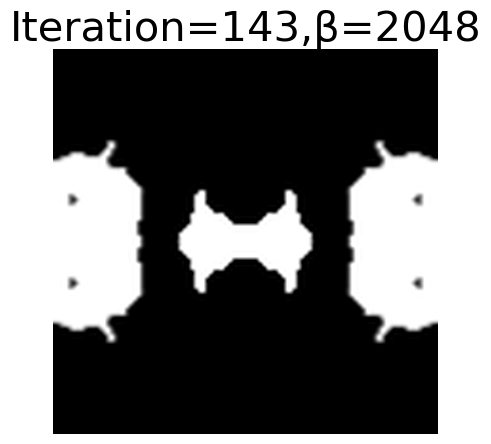

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


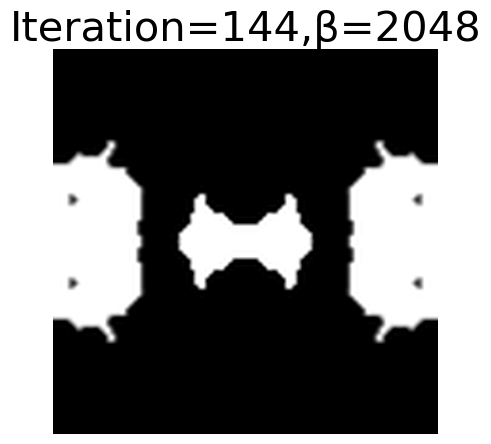

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


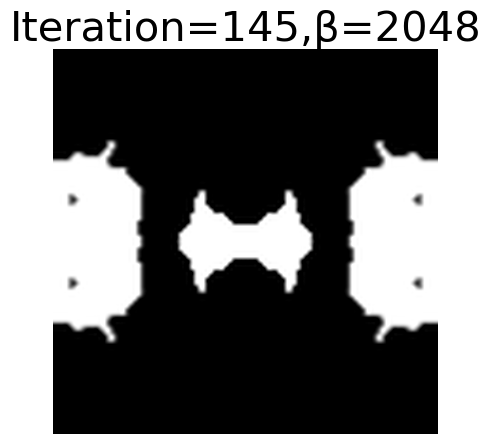

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


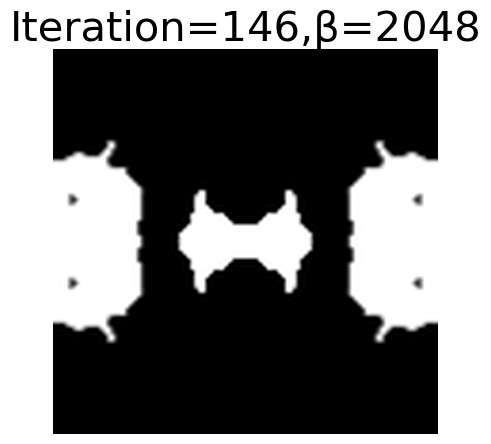

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


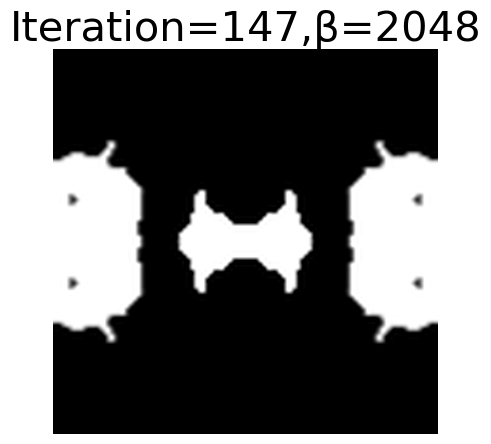

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


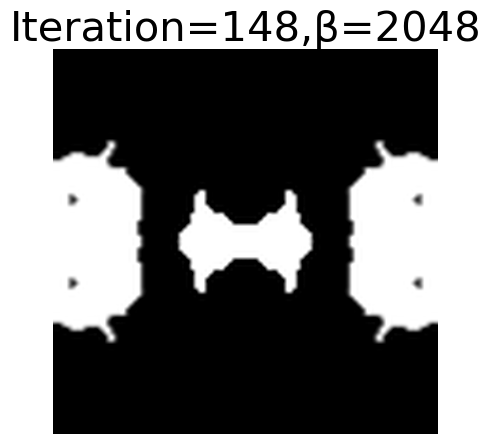

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


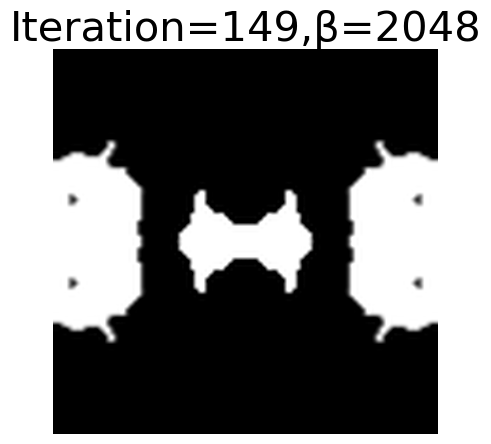

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
2048
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


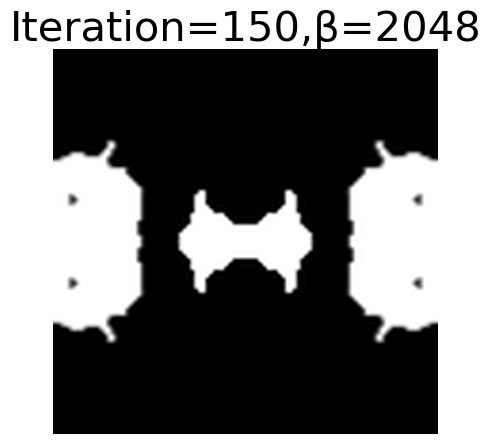

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


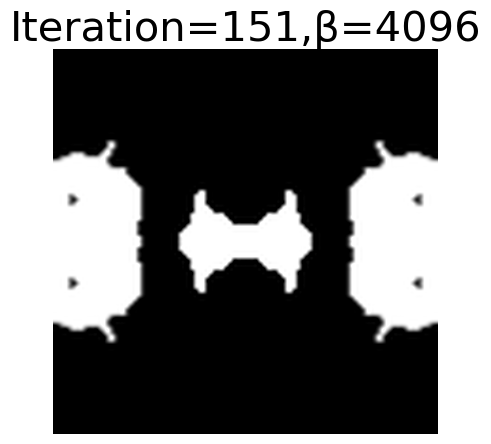

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


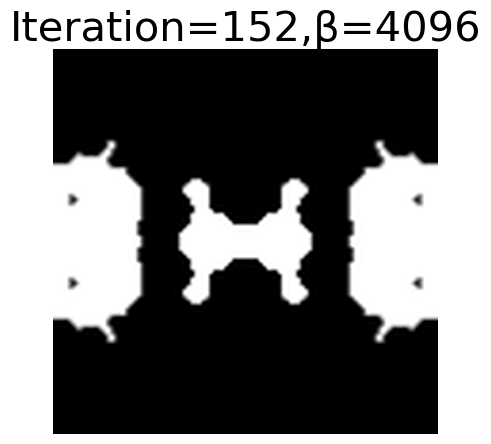

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


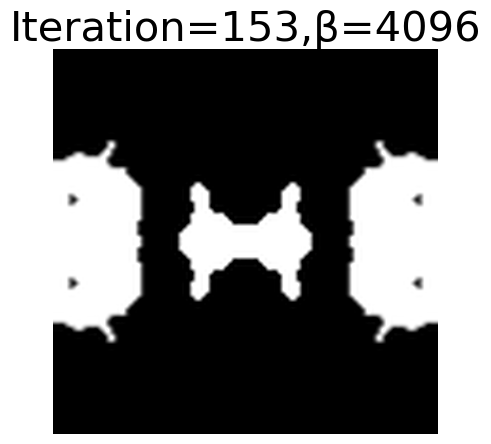

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


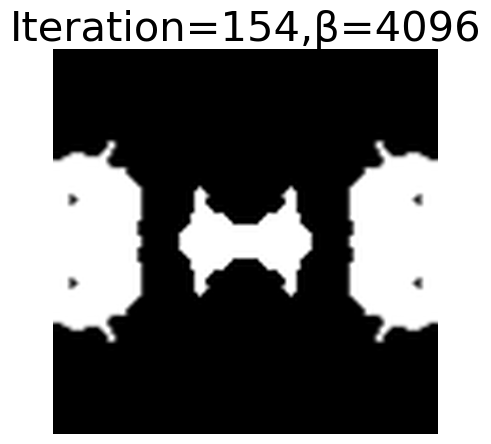

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


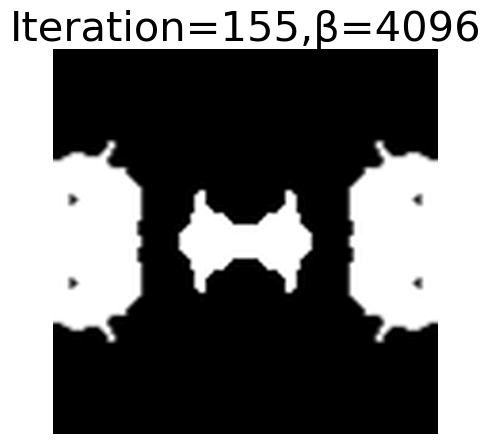

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


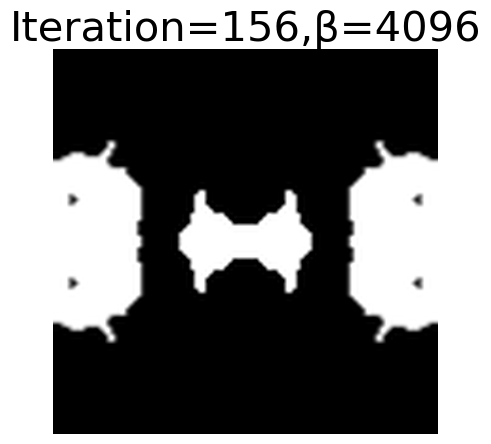

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


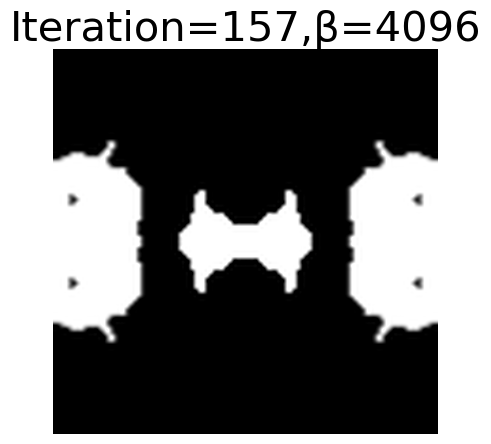

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


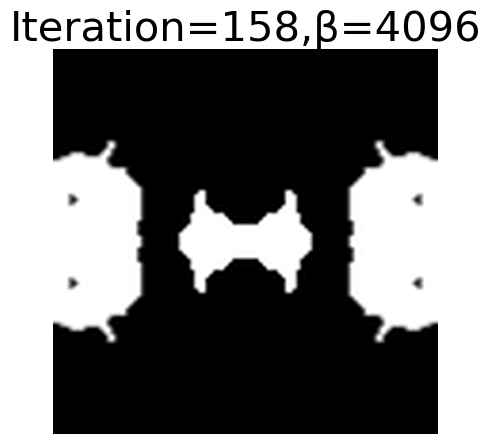

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


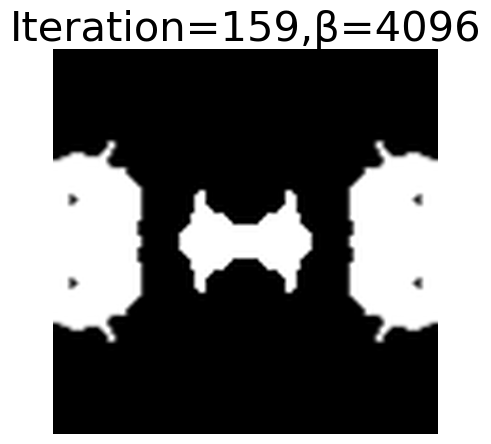

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


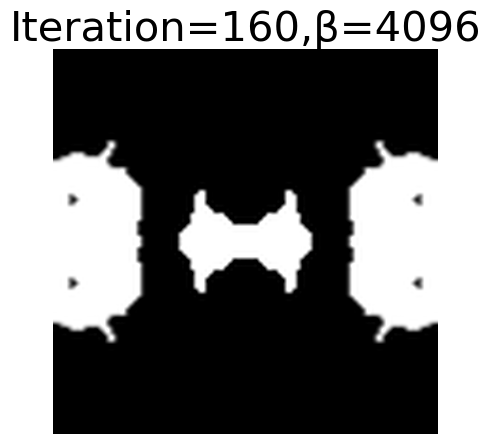

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


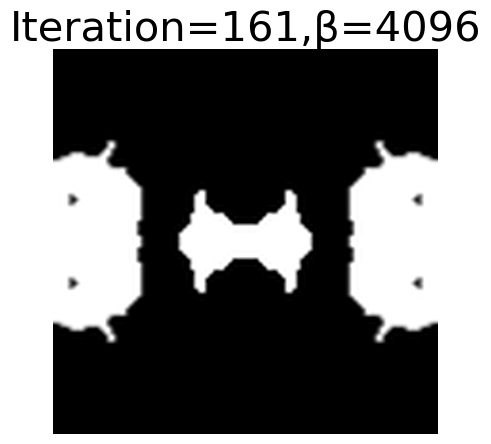

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


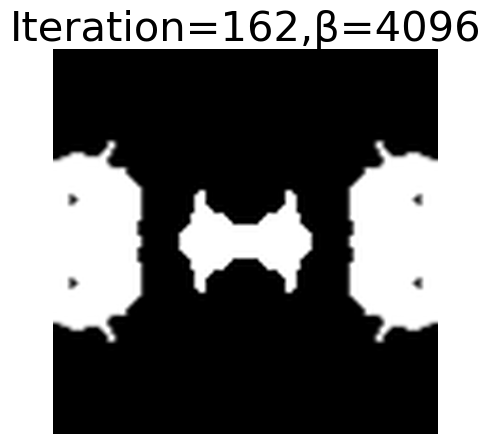

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


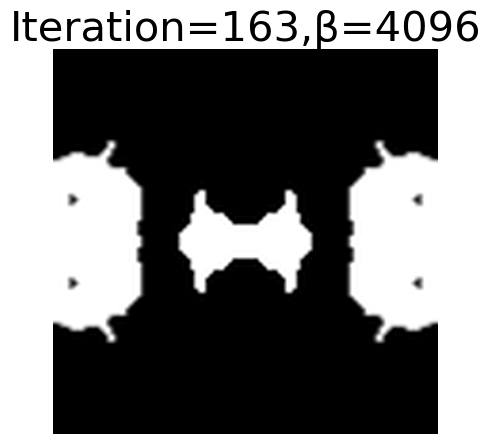

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


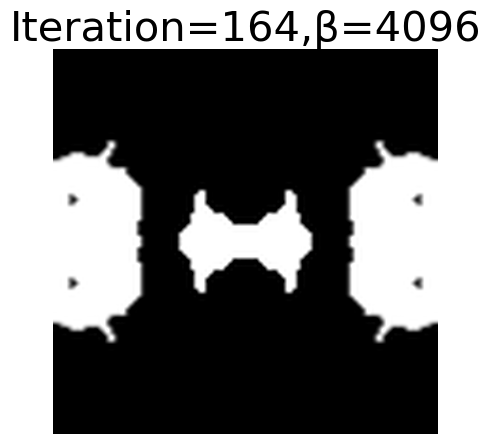

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
4096
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


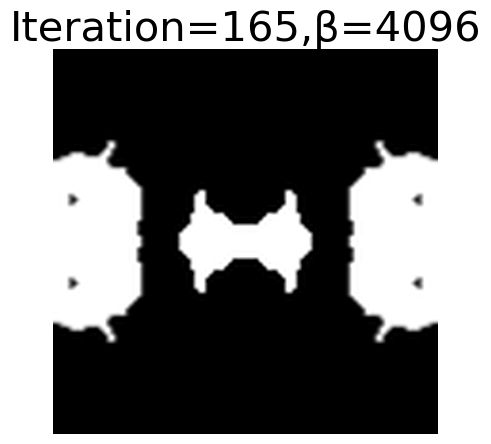

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


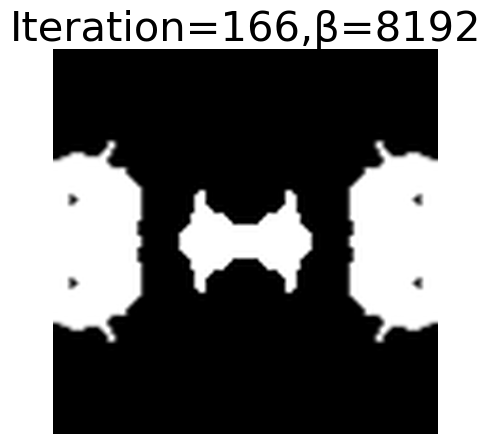

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


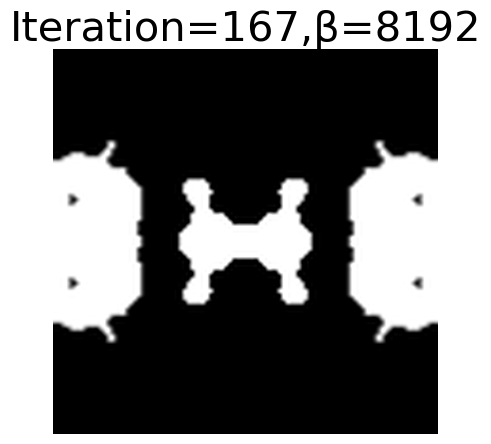

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


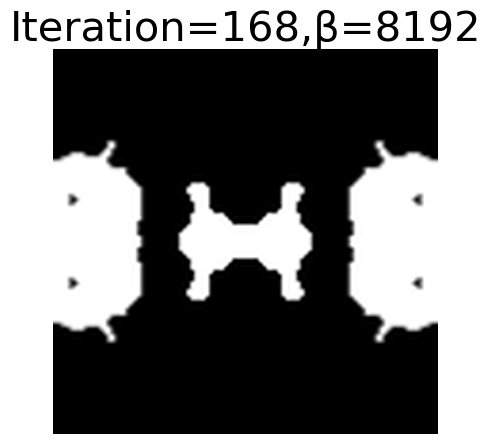

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


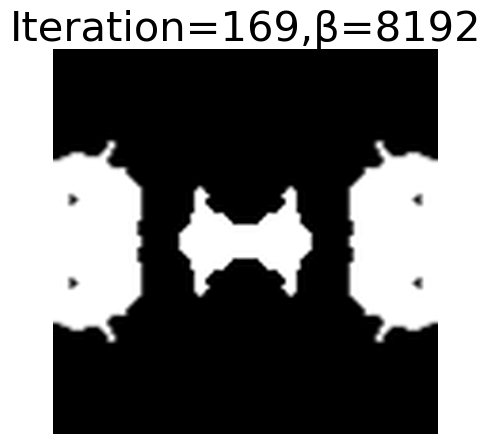

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


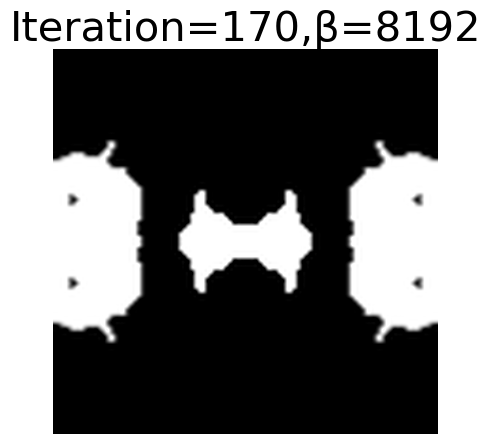

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


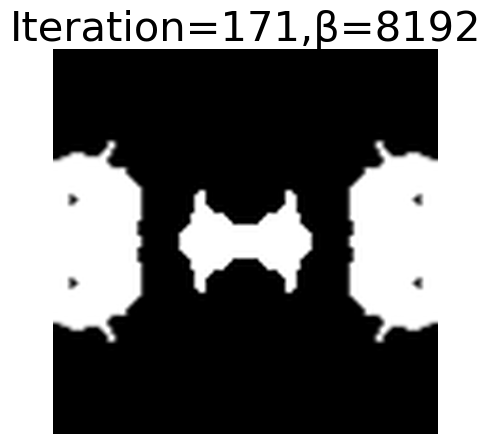

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


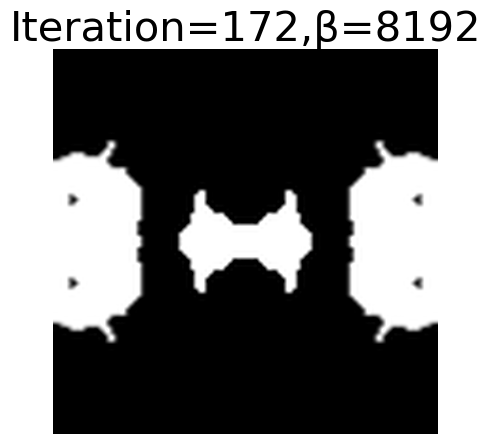

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


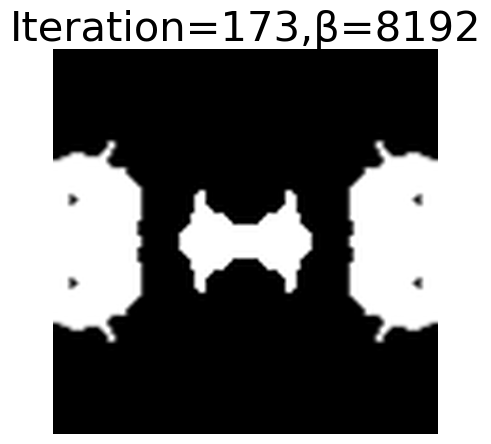

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


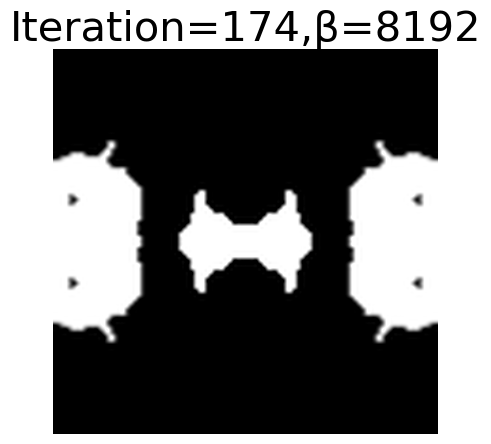

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


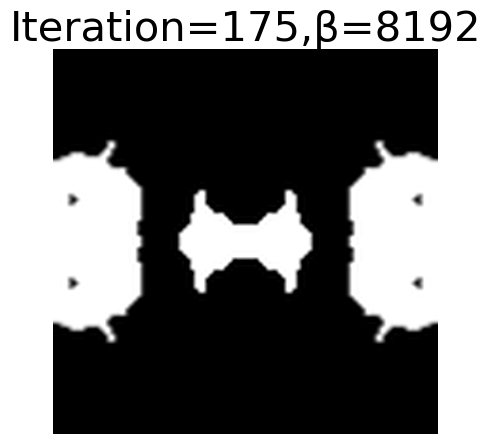

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


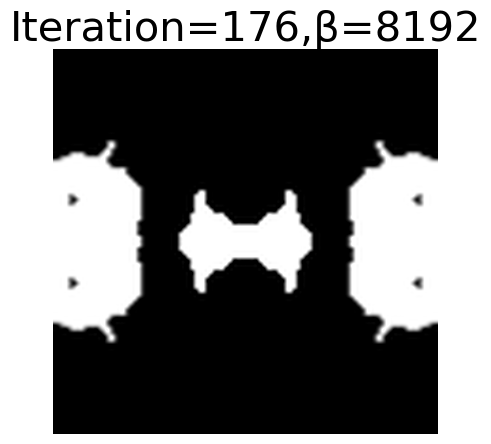

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


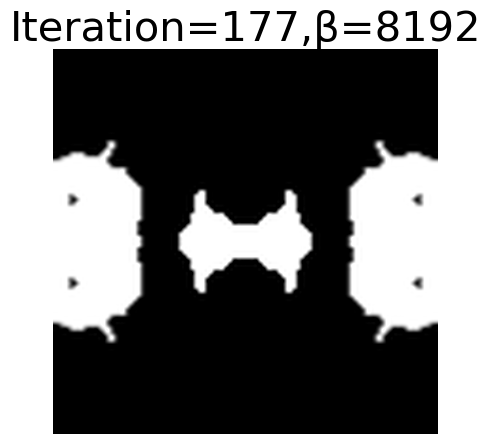

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


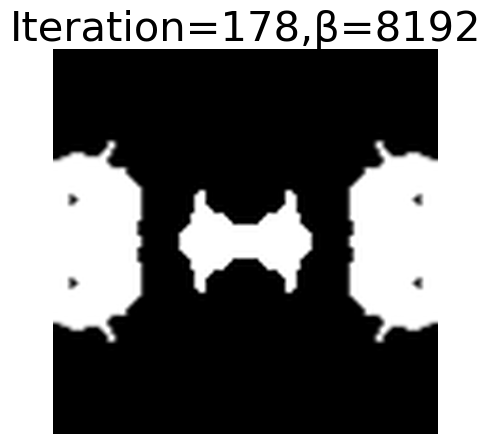

[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]
2
0.5
8192
[0.5381359  0.52779088 0.52378805 ... 0.52378805 0.52779088 0.5381359 ]


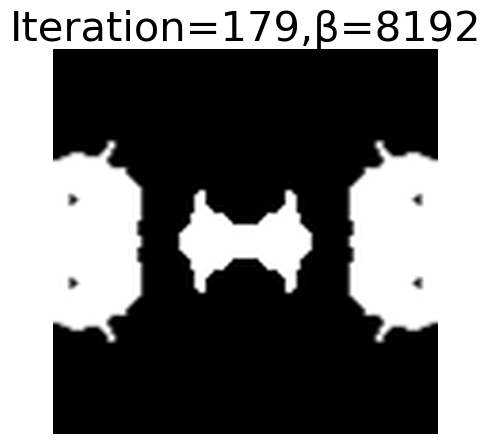

In [3]:
for i in range(1,180):
    v_array = np.load(f'Post_v_array{i:03d}.npy')
    print(v_array)
    beta_A = np.load(f'Post_beta_scale_array{i:03d}.npy')
    print(beta_A)
    eta_A = np.load(f'Post_eta_i_array{i:03d}.npy')
    print(eta_A)
    cur_A = np.load(f'Post_cur_beta_array{i:03d}.npy')
    print(cur_A)
    x_A = np.load(f'Post_x_array{i:03d}.npy')
    print(x_A)
    


    opt.update_design([mapping(v_array, eta_A, cur_A/beta_A)]) # cur_beta/beta_scale is the final beta in the optimization.
    plt.figure(figsize=(5, 5))
    plt.title(f"Iteration={i :d},β={cur_A}", fontsize=30)
    ax = plt.gca()
    opt.plot2D(
        False,
        ax=ax,
        plot_sources_flag=False,
        plot_monitors_flag=False,
        plot_boundaries_flag=False,
        output_plane = mp.Volume(center=mp.Vector3(0,0,0), size=mp.Vector3(design_region_x_width, design_region_y_height, 0))
    )
    circ = Circle((2, 2), minimum_length / 2)
    ax.add_patch(circ)
    ax.axis("off")
    plt.savefig(f'PICTURE/Picture{i:03d}.png')
    plt.show()


    

In [4]:
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image

# Set the directory where your images are stored
image_folder = "PICTURE"
image_files = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(".png")])  # Adjust for JPG, etc.

# Load images using PIL
images = [Image.open(img) for img in image_files]

# Create figure and axis
fig, ax = plt.subplots()
ax.axis("off")  # Hide axis
im = ax.imshow(images[0])  # Initialize with the first image

# Animation function
def update(frame):
    im.set_array(images[frame])
    return [im]

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(images), interval=200, blit=True)
plt.close(fig)
# Display in Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


In [5]:
# Convert images to GIF
output_gif = "animation.gif"

# Save images as an animated GIF
images[0].save(
    output_gif,
    save_all=True,
    append_images=images[1:],
    duration=200,  # 每幀持續時間 (毫秒)
    loop=0         # 0 表示無限循環
)

print(f"GIF 已儲存至 {output_gif}")

GIF 已儲存至 animation.gif
